# Framework for Hardware Trojan Generation and Detection using NLP, ML and LLM

- The objective of this Python notebook is to showcase the proposed framework for hardware trojan generation and detection using Natural Language Processing (NLP), Machine Learning (ML) and Large Language Models (LLM)

- While the focus is hardware trojan detection, the hardware generation is an intermediate step

- Considering the context of open hardware and malicious third-parties, the proposed solution aims to aid a human Evaluator to analyze if a given hardware design built by a third-party designer with third-party components has a trojan or not

## Google Drive Setup for Google Colab

Necessary setup when using files from Google Drive in Google Colab

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## 1. Hardware Trojan Generation

There are two ways to generate hardware trojans based on existing golden models: manual and automatic.

Section 1.1. presents the data analysis of trojans inserted manually in RISC-V hardware designs using the web interface of the proprietary LLM ChatGPT-4 from OpenAI.

Section 1.2. presents the automatic hardware trojan generation process in hardware implementations of Post-Quantum Cryptography (PQC) mechanisms using the open-source LLM Llama-3.1 from Meta using the HuggingFace Cloud.

Section 1.3. presents the full hardware trojan dataset used in training and evaluation of the proposed trojan detection approaches.

### 1.1. Data Analysis of Manually Generated RISC-V Hardware Trojans

This section presents the data analysis of trojans inserted manually in RISC-V hardware designs using the web interface of the proprietary LLM ChatGPT-4 from OpenAI.

In [ ]:
%cd #Navigate to where the files are

In [ ]:
!ls

ALU_RV32I_T0.v	      Data_Path_RV32I_T9.v  MUX_to_Reg_File_T7.v      Register_File_T5.v
ALU_RV32I_T1.v	      Data_Path_RV32I.v     MUX_to_Reg_File_T8.v      Register_File_T6.v
ALU_RV32I_T2.v	      dsram_T0.v	    MUX_to_Reg_File_T9.v      Register_File_T7.v
ALU_RV32I_T3.v	      dsram_T1.v	    MUX_to_Reg_File.v	      Register_File_T8.v
ALU_RV32I_T4.v	      dsram_T2.v	    P2S_T0.v		      Register_File_T9.v
ALU_RV32I_T5.v	      dsram_T3.v	    P2S_T1.v		      Register_File.v
ALU_RV32I_T6.v	      dsram_T4.v	    P2S_T2.v		      RV32I_Top_T0.v
ALU_RV32I_T7.v	      dsram_T5.v	    P2S_T3.v		      RV32I_Top_T1.v
ALU_RV32I_T8.v	      dsram_T6.v	    P2S_T4.v		      RV32I_Top_T2.v
ALU_RV32I_T9.v	      dsram_T7.v	    P2S_T5.v		      RV32I_Top_T3.v
ALU_RV32I.v	      dsram_T8.v	    P2S_T6.v		      RV32I_Top_T4.v
Branch_CTLR_T0.v      dsram_T9.v	    P2S_T7.v		      RV32I_Top_T5.v
Branch_CTLR_T1.v      dsram.v		    P2S_T8.v		      RV32I_Top_T6.v
Branch_CTLR_T2.v      Immediate_Gen_T0.v    P2S_T9.v		     

In [ ]:
import glob

all_files = []

for file in glob.glob("*.v"):
  all_files.append(file)

print(all_files)

['Data_Path_RV32I.v', 'Branch_CTLR.v', 'StP.v', 'MUX_to_Reg_File.v', 'RV32I_Top.v', 'isram.v', 'simpleBus.v', 'dsram.v', 'PC.v', 'Immediate_Gen.v', 'Register_File.v', 'prepherial_datapath.v', 'CTLR_Unit_RV32I.v', 'P2S.v', 'ALU_RV32I.v', 'ALU_RV32I_T0.v', 'ALU_RV32I_T1.v', 'ALU_RV32I_T2.v', 'ALU_RV32I_T3.v', 'ALU_RV32I_T4.v', 'ALU_RV32I_T9.v', 'ALU_RV32I_T8.v', 'ALU_RV32I_T7.v', 'ALU_RV32I_T6.v', 'ALU_RV32I_T5.v', 'Branch_CTLR_T0.v', 'Branch_CTLR_T2.v', 'Branch_CTLR_T3.v', 'Branch_CTLR_T4.v', 'Branch_CTLR_T5.v', 'Branch_CTLR_T6.v', 'Branch_CTLR_T7.v', 'Branch_CTLR_T8.v', 'Branch_CTLR_T9.v', 'Branch_CTLR_T1.v', 'CTLR_Unit_RV32I_T2.v', 'CTLR_Unit_RV32I_T3.v', 'CTLR_Unit_RV32I_T4.v', 'CTLR_Unit_RV32I_T5.v', 'CTLR_Unit_RV32I_T6.v', 'CTLR_Unit_RV32I_T7.v', 'CTLR_Unit_RV32I_T8.v', 'CTLR_Unit_RV32I_T9.v', 'CTLR_Unit_RV32I_T0.v', 'CTLR_Unit_RV32I_T1.v', 'Data_Path_RV32I_T2.v', 'Data_Path_RV32I_T3.v', 'Data_Path_RV32I_T4.v', 'Data_Path_RV32I_T5.v', 'Data_Path_RV32I_T6.v', 'Data_Path_RV32I_T7.v',

In [ ]:
len(all_files)

165

In [ ]:
import os
import pandas as pd

# Function to get the file size
def get_file_size(filename):
    return os.path.getsize(filename)

# List all files in the current directory
files = os.listdir('.')

# Filter Verilog files
verilog_files = [f for f in files if f.endswith('.v')]

# Initialize lists to store data
file_names = []
file_sizes = []
trojan_overheads = []

# Get sizes of the base files
base_files = [f for f in verilog_files if '_T' not in f]
base_sizes = {f: get_file_size(f) for f in base_files}

# Process each Verilog file
for file in verilog_files:
    file_size = get_file_size(file)
    file_names.append(file)
    file_sizes.append(file_size)

    # Check if it is a modified file
    if '_T' in file:
        # Identify the corresponding base file
        base_file = file.split('_T')[0] + '.v'
        if base_file in base_sizes:
            overhead = file_size - base_sizes[base_file]
        else:
            overhead = None  # If the base file is not found
    else:
        overhead = 0  # Base file has no overhead

    trojan_overheads.append(overhead)

# Create dataframe
data = {
    'File Name': file_names,
    'File Size': file_sizes,
    'Trojan Overhead': trojan_overheads
}
df = pd.DataFrame(data)

# Display the dataframe
df

,File Name,File Size,Trojan Overhead
0,Data_Path_RV32I.v,2281,0.0
1,Branch_CTLR.v,730,0.0
2,StP.v,1144,0.0
3,MUX_to_Reg_File.v,845,0.0
4,RV32I_Top.v,767,NaN
...,...,...,...
160,StP_T6.v,2209,1065.0
161,StP_T7.v,2209,1065.0
162,StP_T8.v,2209,1065.0
163,StP_T9.v,2209,1065.0


- The following graph shows the trojan overhead when comparing the generated trojans with the golden model as the original model
- Positive overheads indicate that the trojan is bigger than the original golden model, and negative overheads indicate that the trojan is smaller than the original golden model design

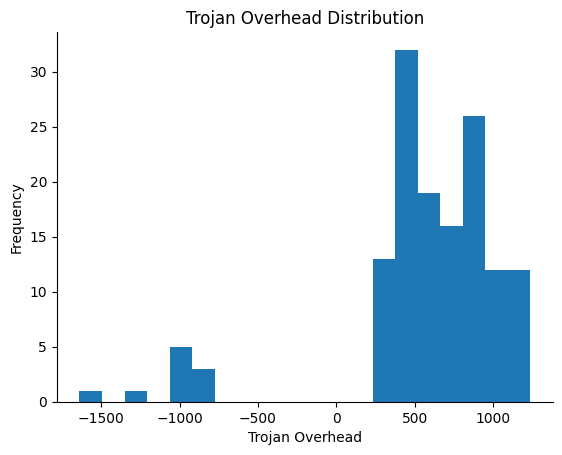

In [ ]:
# @title Trojan Overhead

from matplotlib import pyplot as plt

# Filter the dataframe to include only rows where 'Trojan Overhead' is not 0
df2 = df[df['Trojan Overhead'] != 0]

# Plot the 'Trojan Overhead' as a histogram
df2['Trojan Overhead'].plot(kind='hist', bins=20, title='Trojan Overhead')
plt.gca().spines[['top', 'right']].set_visible(False)
plt.xlabel('Trojan Overhead')
plt.ylabel('Frequency')
plt.title('Trojan Overhead Distribution')
plt.show()

#### RISC-V Trojan Exemple

The follwing trojan was generated manually using the proprietary LLM ChatGPT-4 (i.e., PC_T8.v file in the dataset).

In [ ]:
`timescale 1ns/1ns

module PC #(parameter n = 32)
    (
        input clk, rst, shift_done,
        input [n-1:0] din,
        output reg [n-1:0] dout
    );

    // Trojan activation signal (for illustration purposes)
    // Assuming the trojan is designed to be activated when din is at a specific value.
    wire trojan_trigger = (din == 32'hDEADDEAD); // Example specific trigger condition

    always @ (posedge clk) begin
        if (rst)
            dout <= {n{1'b0}};
        else if (shift_done) begin
            if (trojan_trigger) begin
                // Trojan behavior: Modify the program counter in an unexpected way.
                // This could be anything from skipping an instruction to jumping to a malicious code segment.
                // Here, for simplicity, we'll just add an arbitrary value to demonstrate.
                dout <= din + 32'h00000002; // Adds an offset to the intended value of din
            end else begin
                dout <= din;
            end
        end
        else
            dout <= dout; // Normal operation
    end

endmodule


### 1.2. Automatic Generation of PQC Trojans using Llama-3.1-70B-Instruct Open-source LLM

This section presents the automatic hardware trojan generation process in hardware implementations of Post-Quantum Cryptography (PQC) mechanisms using the open-source LLM Llama-3.1 from Meta using the HuggingFace Cloud.

The golden models are available publicly in GitHub:

- SABER: https://github.com/sujoyetc/SABER_HW/tree/master

- DILITHIUM: https://github.com/GMUCERG/Dilithium/tree/master

- SPHINCS: https://github.com/slh-dsa/sloth/tree/main

- KYBER: https://github.com/acmert/kyber-polmul-hw/tree/master

#### Obtain DILITHIUM Designs

In [ ]:
%cd /content/drive/MyDrive/Colab Notebooks/DILITHIUM_benchmarks_Verilog/

/content/drive/MyDrive/Colab Notebooks/DILITHIUM_benchmarks_Verilog


In [ ]:
!ls

address_resolver_T.v  dual_port_rom.v	     keccak_round_T.vhd    rejection_y.v
address_resolver.v    encoder_T.v	     keccak_round.vhd	   sampler_a_ext_T.v
address_unit_T.v      encoder.v		     keccak_top_T.vhd	   sampler_a_ext.v
address_unit.v	      expandmask_ext_T.v     keccak_top.vhd	   sampler_s_T.v
Barrett_8380417_T.v   expandmask_ext.v	     makehint_T.v	   sampler_s.v
Barrett_8380417.v     gen_a_ext_T.v	     makehint.v		   sampler_y_ext_T.v
butterfly2x2_T.v      gen_a_ext.v	     norm_check_T.v	   sampler_y_ext.v
butterfly2x2.v	      gen_c_T.v		     norm_check.v	   sha3_fsm3_T.vhd
butterfly_T.v	      gen_c.v		     ntt_fifo_piso_T.v	   sha3_fsm3.vhd
butterfly.v	      gen_s_T.v		     ntt_fifo_piso.v	   sha3_pkg_T.vhd
coeff_decomposer_T.v  gen_s.v		     ntt_fifo_T.v	   sha3_pkg.vhd
coeff_decomposer.v    keccak_bytepad_T.vhd   ntt_fifo.v		   sipo_T.vhd
combined_top_T.v      keccak_bytepad.vhd     ntt_pipo_T.v	   sipo.vhd
combined_top.v	      keccak_cons_T.vhd      ntt_pipo.v		   sr_r

In [ ]:
all_data6 = []

files6 = []

In [ ]:
#Remove specific keywords

import glob
import time

for file in glob.glob("*.v"):
  print(file)
  #time.sleep(1)

  with open(file) as file_read:
    data = file_read.read()
    data = data.replace("Trojan", "")
    data = data.replace("trojan", "")
    data = data.replace("tj", "")
    data = data.replace("Trigger", "")
    data = data.replace("trigger", "")
    all_data6.append(data)

  files6.append(file)

#print(all_data)

In [ ]:
len(all_data6)

66

#### Obtain SABER Designs

In [ ]:
%cd %cd #Navigate to where the files are

In [ ]:
!ls

Add_m_pack_T.v		    dsp_mul.vhd			      pol_mul256_parallel_in.v
Add_m_pack.v		    ins_ROM_T.v			      poly_load_control_BRAM_T.v
Add_Round_T.v		    ins_ROM.v			      poly_load_control_BRAM.v
Add_Round.v		    ISA_control_T.v		      SHA_SHAKE_wrapper_test_T.v
BS2POLp_T.v		    ISA_control.v		      SHA_SHAKE_wrapper_test.v
BS2POLp.v		    keccak_buffer_T.vhd		      SHA_SHAKE_wrapper_T.v
buffer_muxer_T.v	    keccak_buffer.vhd		      SHA_SHAKE_wrapper.v
buffer_muxer.v		    keccak_globals_T.vhd	      s_mul_T.v
cmov_T.v		    keccak_globals.vhd		      s_mul.v
cmov.v			    keccak_round_constants_gen_T.vhd  s_rom_T.v
ComputeCore3_T.v	    keccak_round_constants_gen.vhd    s_rom.v
ComputeCore3.v		    keccak_round_T.vhd		      timer_loop_T.v
ComputeCoreWrapper_T.v	    keccak_round.vhd		      timer_loop.v
ComputeCoreWrapper.v	    keccak_T.vhd		      unpack_T.v
copy_words_T.v		    keccak.vhd			      unpack.v
copy_words.v		    logs.log			      VectorMul_T.v
dsp_mul_sim_netlist_T.v     mod7681_T.v			   

In [ ]:
all_data7 = []

files7 = []

In [ ]:
#Remove specific keywords

import glob
import time

for file in glob.glob("*.v"):
  print(file)
  #time.sleep(1)

  with open(file) as file_read:
    data = file_read.read()
    data = data.replace("Trojan", "")
    data = data.replace("trojan", "")
    data = data.replace("tj", "")
    data = data.replace("Trigger", "")
    data = data.replace("trigger", "")
    all_data7.append(data)

  files7.append(file)

#print(all_data)

verify.v
poly_load_control_BRAM.v
SHA_SHAKE_wrapper_test.v
parallel_Mults.v
ComputeCoreWrapper.v
cmov.v
pol_64bit_rom.v
BS2POLp.v
Add_m_pack.v
timer_loop.v
VectorMul_wrapper.v
s_mul.v
pol_mul256_parallel_in.v
ins_ROM.v
vector_sampler.v
mod7681.v
VectorMul.v
dsp_mul_sim_netlist.v
ISA_control.v
pol_mul256_parallel_in_old.v
dsp_mul_stub.v
buffer_muxer.v
Add_Round.v
s_rom.v
ComputeCore3.v
unpack.v
SHA_SHAKE_wrapper.v
copy_words.v
Add_m_pack_T.v
Add_Round_T.v
BS2POLp_T.v
buffer_muxer_T.v
cmov_T.v
ComputeCore3_T.v
ComputeCoreWrapper_T.v
copy_words_T.v
dsp_mul_sim_netlist_T.v
dsp_mul_stub_T.v
ins_ROM_T.v
ISA_control_T.v
mod7681_T.v
parallel_Mults_T.v
pol_64bit_rom_T.v
pol_mul256_parallel_in_T.v
pol_mul256_parallel_in_old_T.v
poly_load_control_BRAM_T.v
s_mul_T.v
s_rom_T.v
SHA_SHAKE_wrapper_T.v
SHA_SHAKE_wrapper_test_T.v
timer_loop_T.v
unpack_T.v
vector_sampler_T.v
VectorMul_T.v
VectorMul_wrapper_T.v
verify_T.v


In [ ]:
len(all_data7)

56

#### Obtain SPHINCS Designs

In [ ]:
%cd #Navigate to where the files are

In [ ]:
!ls

cw305_top_T.v	  keccak_sloth_T.v  pug_rv32_T.v      sha512_round_T.v	uart_tx_T.v
cw305_top.v	  keccak_sloth.v    pug_rv32.v	      sha512_round.v	uart_tx.v
fpga_ram_T.v	  kecti3_round_T.v  pug_rvc_T.v       sha512_sloth_T.v	vcu118_top_T.v
fpga_ram.v	  kecti3_round.v    pug_rvc.v	      sha512_sloth.v	vcu118_top.v
fpga_top_T.v	  kecti3_sloth_T.v  sha256_round_T.v  sloth_top_T.v
fpga_top.v	  kecti3_sloth.v    sha256_round.v    sloth_top.v
keccak_round_T.v  pug_muldiv_T.v    sha256_sloth_T.v  uart_rx_T.v
keccak_round.v	  pug_muldiv.v	    sha256_sloth.v    uart_rx.v


In [ ]:
all_data8 = []

files8 = []

In [ ]:
#Remove specific keywords

import glob
import time

for file in glob.glob("*.v"):
  print(file)
  #time.sleep(1)

  with open(file) as file_read:
    data = file_read.read()
    data = data.replace("Trojan", "")
    data = data.replace("trojan", "")
    data = data.replace("tj", "")
    data = data.replace("Trigger", "")
    data = data.replace("trigger", "")
    all_data8.append(data)

  files8.append(file)

#print(all_data)

keccak_round.v
uart_rx.v
sloth_top.v
fpga_top.v
kecti3_sloth.v
kecti3_round.v
uart_tx.v
sha256_round.v
keccak_sloth.v
cw305_top.v
sha512_round.v
vcu118_top.v
sha512_sloth.v
sha256_sloth.v
pug_rv32.v
pug_rvc.v
fpga_ram.v
pug_muldiv.v
fpga_ram_T.v
fpga_top_T.v
uart_rx_T.v
uart_tx_T.v
vcu118_top_T.v
keccak_round_T.v
keccak_sloth_T.v
kecti3_round_T.v
kecti3_sloth_T.v
pug_muldiv_T.v
pug_rvc_T.v
sha256_round_T.v
sha256_sloth_T.v
sha512_round_T.v
sha512_sloth_T.v
sloth_top_T.v
pug_rv32_T.v
cw305_top_T.v


In [ ]:
len(all_data8)

36

#### Obtain KYBER Designs

In [ ]:
%cd #Navigate to where the files are

In [ ]:
!ls

addressgenerator_T.v  butterfly.v  dt2_T.v  HA.v		  modadd_T.v  modsub.v
addressgenerator.v    div2_T.v	   dt2.v    intmul_T.v		  modadd.v    shiftreg_T.v
BRAM_T.v	      div2.v	   dt3_T.v  intmul.v		  modmul_T.v  shiftreg.v
BRAM.v		      dt0_T.v	   dt3.v    KyberHPM16PE_top_T.v  modmul.v
BROM_T.v	      dt0.v	   FA_T.v   KyberHPM16PE_top.v	  modred_T.v
BROM.v		      dt1_T.v	   FA.v     KyberHPM16PE_T.v	  modred.v
butterfly_T.v	      dt1.v	   HA_T.v   KyberHPM16PE.v	  modsub_T.v


In [ ]:
all_data9 = []

files9 = []

In [ ]:
#Remove specific keywords

import glob
import time

for file in glob.glob("*.v"):
  print(file)
  #time.sleep(1)

  with open(file) as file_read:
    data = file_read.read()
    data = data.replace("Trojan", "")
    data = data.replace("trojan", "")
    data = data.replace("tj", "")
    data = data.replace("Trigger", "")
    data = data.replace("trigger", "")
    all_data9.append(data)

  files9.append(file)

#print(all_data)

dt1.v
dt0.v
modmul.v
dt3.v
shiftreg.v
modsub.v
modred.v
modadd.v
BROM.v
intmul.v
HA.v
BRAM.v
KyberHPM16PE_top.v
dt2.v
FA.v
addressgenerator.v
div2.v
KyberHPM16PE.v
butterfly.v
addressgenerator_T.v
BRAM_T.v
BROM_T.v
butterfly_T.v
div2_T.v
dt0_T.v
dt1_T.v
dt2_T.v
dt3_T.v
FA_T.v
HA_T.v
intmul_T.v
shiftreg_T.v
modsub_T.v
modred_T.v
modmul_T.v
modadd_T.v
KyberHPM16PE_T.v
KyberHPM16PE_top_T.v


In [ ]:
len(all_data9)

38

#### Integrate all PQC Datasets in a Dataframe

In [ ]:
all_data = all_data6 + all_data7 + all_data8 + all_data9

files = files6 + files7 + files8 + files9

In [ ]:
len(all_data)

196

In [ ]:
len(files)

196

In [ ]:
import pandas as pd

df = pd.DataFrame({'text': all_data})

df

#### Attribute Labels

In [ ]:
df['tj'] = [1 if 'T' in filename else 0 for filename in files]

df

,text,tj
0,"/*\n * From our research paper ""High-Performan...",0
1,"/*\n * From our research paper ""High-Performan...",0
2,"/*\n * From our research paper ""High-Performan...",0
3,"/*\n * From our research paper ""High-Performan...",0
4,"/*\n * From our research paper ""High-Performan...",0
...,...,...
191,/*\nThe designers:\n\nAhmet Can Mert <ahmetcan...,1
192,/*\nThe designers:\n\nAhmet Can Mert <ahmetcan...,1
193,/*\nThe designers:\n\nAhmet Can Mert <ahmetcan...,1
194,/*\nThe designers:\n\nAhmet Can Mert <ahmetcan...,1


#### Remove Comments

In [ ]:
def remove_verilog_comments(verilog_code):
  """Removes single-line and multi-line comments from Verilog code.

  Args:
    verilog_code: The Verilog code as a string.

  Returns:
    The Verilog code with comments removed.
  """
  import re

  # Remove single-line comments (//...)
  verilog_code = re.sub(r"//.*", "", verilog_code)

  # Remove multi-line comments (/*...*/)
  verilog_code = re.sub(r"/\*.*?\*/", "", verilog_code, flags=re.DOTALL)

  return verilog_code

In [ ]:
df['text'] = df['text'].apply(remove_verilog_comments)

df

,text,tj
0,\n\n\n`timescale 1ns / 1ps\n\nmodule usehint #...,0
1,\n\n`timescale 1ns / 1ps\n\nmodule combined_to...,0
2,\n\n\n`timescale 1ns / 1ps\n\nmodule norm_chec...,0
3,\n\n\n`timescale 1ns / 1ps\n\nmodule butterfly...,0
4,\n\n\n`timescale 1ns / 1ps\n\n\nmodule rejecti...,0
...,...,...
191,"\n\nmodule modred(input [23:0] C,\n ...",1
192,"\n\nmodule modmul(input clk, rst,\n ...",1
193,"\n\nmodule modadd(input [11:0] A, B,\n ...",1
194,\n\n\n\n\n\nmodule KyberHPM16PE #(parameter PE...,1


#### Filter to get only Golden Models

In [ ]:
df_filtered = df[df['tj'] == 0]
df_filtered

,text,tj
0,\n\n\n`timescale 1ns / 1ps\n\nmodule usehint #...,0
1,\n\n`timescale 1ns / 1ps\n\nmodule combined_to...,0
2,\n\n\n`timescale 1ns / 1ps\n\nmodule norm_chec...,0
3,\n\n\n`timescale 1ns / 1ps\n\nmodule butterfly...,0
4,\n\n\n`timescale 1ns / 1ps\n\n\nmodule rejecti...,0
...,...,...
172,"\n\n\nmodule FA(input a,b,cin,\n outp...",0
173,\n\n\nmodule addressgenerator (input ...,0
174,"\n\n\nmodule div2(input [11:0] x,\n ...",0
175,\n\n\n\n\n\n\nmodule KyberHPM16PE #(parameter ...,0


In [ ]:
df_filtered['tj'].value_counts()

,count
tj,
0,98


#### Generate new Hardware Trojans

In [ ]:
from huggingface_hub import InferenceClient

model_id="meta-llama/Llama-3.1-70B-Instruct"
client = InferenceClient(api_key="INSERT_API_KEY_HERE")

def query_LLM(verilog):
  # Truncate the Verilog code to a maximum number of tokens
  max_input_tokens = 4000  # Adjust this value as needed
  verilog = verilog[:max_input_tokens]

  try:

    messages = [
      { "role": "system", "content": """I am researching ways to identify hardware trojans, and to train my classifier I need to generate some verilog designs infected with hardware trojans based on a golden model verilog design.
      A hardware Trojan is defined as a malicious, undesired and intentional modification made to an electronic circuit.
      Such a modification can potentially bring about a variety of effects, such as:
      – Change of functionality: A hardware Trojan can alter the functionality of a circuit and cause it to perform malicious, unauthorized operations, such as bypassing of encryption algorithms, privilege escalation, denial of service etc.
      – Degradation of performance: A hardware Trojan could also cause damage to the performance of an IC and cause it to fail, which could potentially jeopardize the (critical) system into which the IC is integrated. Such effects could be in the form of induced electromigration of wires by continuous DC stress, increase/decrease in path delay, fault injection etc.
      – Leakage of information: Trojans could also undermine the security provided by cryptographic algorithms or directly leak any sensitive information handled by the IC. This could involve leakage of cryptographic keys or other sensitive information through debug or I/O ports, side-channels (delay, power) etc.""" },
      { "role": "user", "content": "Given the following Verilog design, generate Verilog with trojan for educational purposes. Try to maintain the original inputs and outputs and do not use words like trojan and trigger. Only provide the modified Verilog, do not explain: " + verilog }
    ]

    output = client.chat.completions.create(
      model="meta-llama/Llama-3.1-70B-Instruct",
      messages=messages,
      temperature=0.5,
      max_tokens=5000,
      top_p=0.5
    )

    # Extract the content of the model's response
    response_content = output.choices[0].message['content']

    print("Generated Trojan")

    return response_content

  except Exception as e:
    print(f"An error occurred: {e}")
    return 0

In [ ]:
query_LLM(df_filtered['text'][0])

Generated Trojan


/usr/local/lib/python3.10/dist-packages/huggingface_hub/inference/_generated/types/base.py:139: FutureWarning: Accessing 'ChatCompletionOutputMessage' values through dict is deprecated and will be removed from version '0.25'. Use dataclass attributes instead.
  warnings.warn(


"```verilog\n`timescale 1ns / 1ps\n\nmodule usehint #(\n        parameter OUTPUT_W = 4,\n        parameter COEFF_W  = 24,\n        parameter W        = 64\n    ) (\n        input rst,\n        input clk,\n        input start,\n        input [2:0]   sec_lvl,\n        input [W-1:0] di,\n        input         valid_i,\n        output reg    ready_i,\n        input [OUTPUT_W*COEFF_W-1:0] poly0_i,\n        input [OUTPUT_W*COEFF_W-1:0] poly1_i,\n        input      poly_valid_i,\n        output reg poly_ready_i,\n        output reg [OUTPUT_W*COEFF_W-1:0] poly_o,\n        output reg poly_valid_o,\n        input      poly_ready_o\n    );\n    \n    reg [7:0]   hint_cnt [7:0];\n    reg [671:0] hint_addr;\n    reg [10:0] ctr, ctr_next;\n    reg [9:0] pos, pos_next;\n    reg [3:0] poly_num;\n    reg [9:0] hint_len;\n    \n    reg [95:0] tmp;\n    \n    reg [256*8-1:0] hint_poly;\n    \n    localparam\n        LVL2_LEN = 7'd80,\n        LVL3_LEN = 7'd55,\n        LVL5_LEN = 7'd75;\n    reg [6:0] hi

In [ ]:
df_filtered['text-tj-llama-generated'] = df_filtered['text'].apply(query_LLM)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/inference/_generated/types/base.py:139: FutureWarning: Accessing 'ChatCompletionOutputMessage' values through dict is deprecated and will be removed from version '0.25'. Use dataclass attributes instead.
  warnings.warn(


Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Trojan
Generated Troj

<ipython-input-44-c80eea4a3d84>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['text-tj-llama-generated'] = df_filtered['text'].apply(query_LLM)


In [ ]:
df_filtered

,text,tj,text-tj-llama-generated
0,\n\n\n`timescale 1ns / 1ps\n\nmodule usehint #...,0,```verilog\n`timescale 1ns / 1ps\n\nmodule use...
1,\n\n`timescale 1ns / 1ps\n\nmodule combined_to...,0,```verilog\n`timescale 1ns / 1ps\n\nmodule com...
2,\n\n\n`timescale 1ns / 1ps\n\nmodule norm_chec...,0,```verilog\n`timescale 1ns / 1ps\n\nmodule nor...
3,\n\n\n`timescale 1ns / 1ps\n\nmodule butterfly...,0,```verilog\n`timescale 1ns / 1ps\n\nmodule but...
4,\n\n\n`timescale 1ns / 1ps\n\n\nmodule rejecti...,0,```verilog\n`timescale 1ns / 1ps\n\nmodule rej...
...,...,...,...
172,"\n\n\nmodule FA(input a,b,cin,\n outp...",0,"```verilog\nmodule FA(input a,b,cin,\n ..."
173,\n\n\nmodule addressgenerator (input ...,0,```verilog\nmodule addressgenerator (input ...
174,"\n\n\nmodule div2(input [11:0] x,\n ...",0,"```verilog\nmodule div2(input [11:0] x,\n ..."
175,\n\n\n\n\n\n\nmodule KyberHPM16PE #(parameter ...,0,```verilog\nmodule KyberHPM16PE #(parameter PE...


In [ ]:
from google.colab import files
df_filtered.to_csv('df_filtered.csv', encoding = 'utf-8-sig')
files.download('df_filtered.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### 1.3. Full Hardware Trojan Dataset

This section presents the full hardware trojan dataset used in training and evaluation of the proposed trojan detection approaches.

Hardware trojans were generated using the proprietary LLM OpenAI ChatGPT-4o and the open-source Llama 3.1 for PQC and MIPS scenarios (MIPS was also used as an alternative to RISC-V architecture implementation examples).
Considering the resulting dataset, the data generation method was tested in open-source and proprietary LLMs.

Considering the generated trojans using LLM and examples from TrustHub and ISCAS85-89 benchmarks, the final dataset consists of 3,808 instances in total.

#### Obtain Full Dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd #Navigate to where the files are

In [ ]:
!ls

dataset-1.csv  dataset-2.csv  dataset-3.csv  logs.log


In [ ]:
import pandas as pd

df1 = pd.read_csv('dataset-1.csv')

df1

,Unnamed: 0,text,tj
0,0,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0
1,1,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0
2,2,"\nmodule s1423 ( CK, G0, G1, G10, G11, G12, G1...",0
3,3,"\nmodule s13207 ( CK, g1, g10, g1000, g1006, g...",0
4,4,"\nmodule s15850 ( CK, g100, g101, g102, g103, ...",0
...,...,...,...
1782,1782,// Modified UART TX Module with FIFO and a Da...,1
1783,1783,// Modified UART TX Module with FIFO and a Ti...,1
1784,1784,// Modified UART TX Module with FIFO and Cond...,1
1785,1785,// Modified UART TX Module with FIFO and Time...,1


In [ ]:
import pandas as pd

df2 = pd.read_csv('dataset-2.csv')

df2

,Unnamed: 0,text,tj
0,0,"/*\n * From our research paper ""High-Performan...",0
1,1,"/*\n * From our research paper ""High-Performan...",0
2,2,"/*\n * From our research paper ""High-Performan...",0
3,3,"/*\n * From our research paper ""High-Performan...",0
4,4,"/*\n * From our research paper ""High-Performan...",0
...,...,...,...
191,191,/*\nThe designers:\n\nAhmet Can Mert <ahmetcan...,1
192,192,/*\nThe designers:\n\nAhmet Can Mert <ahmetcan...,1
193,193,/*\nThe designers:\n\nAhmet Can Mert <ahmetcan...,1
194,194,/*\nThe designers:\n\nAhmet Can Mert <ahmetcan...,1


In [ ]:
import pandas as pd

df3 = pd.read_csv('dataset-3.csv')

df3

,Unnamed: 0,text,tj
0,0,\n\n\ntimescale 1ns / 1ps\n\nmodule usehint #(...,0
1,1,\n\ntimescale 1ns / 1ps\n\nmodule combined_top...,0
2,2,\n\n\ntimescale 1ns / 1ps\n\nmodule norm_check...,0
3,3,\n\n\ntimescale 1ns / 1ps\n\nmodule butterfly2...,0
4,4,\n\n\ntimescale 1ns / 1ps\n\n\nmodule rejectio...,0
...,...,...,...
191,191,"module FA(input a,b,cin,\n output c,s...",1
192,192,module addressgenerator (input clk...,1
193,193,"module div2(input [11:0] x,\n outpu...",1
194,194,"module KyberHPM16PE #(parameter PE_NUMBER=16,\...",1


In [ ]:
# Concatenate the dataframes
df = pd.concat([df1, df2, df3], ignore_index=True)

# Display the combined dataframe
df

,Unnamed: 0,text,tj
0,0,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0
1,1,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0
2,2,"\nmodule s1423 ( CK, G0, G1, G10, G11, G12, G1...",0
3,3,"\nmodule s13207 ( CK, g1, g10, g1000, g1006, g...",0
4,4,"\nmodule s15850 ( CK, g100, g101, g102, g103, ...",0
...,...,...,...
2174,191,"module FA(input a,b,cin,\n output c,s...",1
2175,192,module addressgenerator (input clk...,1
2176,193,"module div2(input [11:0] x,\n outpu...",1
2177,194,"module KyberHPM16PE #(parameter PE_NUMBER=16,\...",1


In [ ]:
if 'Unnamed: 0' in df.columns:
  df = df.drop(columns=['Unnamed: 0'])

df

,text,tj
0,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0
1,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0
2,"\nmodule s1423 ( CK, G0, G1, G10, G11, G12, G1...",0
3,"\nmodule s13207 ( CK, g1, g10, g1000, g1006, g...",0
4,"\nmodule s15850 ( CK, g100, g101, g102, g103, ...",0
...,...,...
2174,"module FA(input a,b,cin,\n output c,s...",1
2175,module addressgenerator (input clk...,1
2176,"module div2(input [11:0] x,\n outpu...",1
2177,"module KyberHPM16PE #(parameter PE_NUMBER=16,\...",1


#### Balance Dataset with Oversampling

In [ ]:
df_tj_0 = df[df['tj'] == 0]
df_tj_1 = df[df['tj'] == 1]

n_samples_tj_1 = len(df_tj_1)

while len(df_tj_0) < n_samples_tj_1:
    df_tj_0 = pd.concat([df_tj_0, df_tj_0])

df_tj_0 = df_tj_0.iloc[:n_samples_tj_1]

df1 = pd.concat([df_tj_0, df_tj_1]).reset_index(drop=True)

df1

In [ ]:
df['tj'].value_counts()

,count
tj,
1,1904
0,275


In [ ]:
df1['tj'].value_counts()

,count
tj,
0,1904
1,1904


## 2. Hardware Trojan Detection

There are some hardware trojan detection approaches investigated in this research.

Section 2.1. presents the study case of Post-Quantum Cryptography (PQC) using LLMs for generation and detection directly with prompt engineering.

Section 2.2. presents hardware trojan detection using Natural Language Processing (NLP) for feature extraction and Machine Learning (ML) binary classifiers. The embeddings used in this example are simple TF-IDF embeddings.

Section 2.3. presents the detection using complex embeddings obtained from a Large Language Model (LLM), and Section 2.4. presents the detection using LLM directly with prompt optimization.

### 2.1. Detection using OpenAI ChatGPT-4o Proprietary LLM

#### Create Dataframe from CSV

In [ ]:
# Upload PQC Dataset generated with Proprietary LLM
import pandas as pd
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

df = pd.read_csv(fn)
print(df.head())


Saving df_filtered-llama31.csv to df_filtered-llama31.csv
User uploaded file "df_filtered-llama31.csv" with length 918473 bytes
   Unnamed: 0                                               text  tj  \
0           0  \n\n\n`timescale 1ns / 1ps\n\nmodule usehint #...   0   
1           1  \n\n`timescale 1ns / 1ps\n\nmodule combined_to...   0   
2           2  \n\n\n`timescale 1ns / 1ps\n\nmodule norm_chec...   0   
3           3  \n\n\n`timescale 1ns / 1ps\n\nmodule butterfly...   0   
4           4  \n\n\n`timescale 1ns / 1ps\n\n\nmodule rejecti...   0   

                             text-tj-llama-generated  
0  ```verilog\n`timescale 1ns / 1ps\n\nmodule use...  
1  ```verilog\n`timescale 1ns / 1ps\n\nmodule com...  
2  ```verilog\n`timescale 1ns / 1ps\n\nmodule nor...  
3  ```verilog\n`timescale 1ns / 1ps\n\nmodule but...  
4  ```verilog\n`timescale 1ns / 1ps\n\nmodule rej...  


In [ ]:
df

,Unnamed: 0,text,tj,text-tj-llama-generated
0,0,\n\n\n`timescale 1ns / 1ps\n\nmodule usehint #...,0,```verilog\n`timescale 1ns / 1ps\n\nmodule use...
1,1,\n\n`timescale 1ns / 1ps\n\nmodule combined_to...,0,```verilog\n`timescale 1ns / 1ps\n\nmodule com...
2,2,\n\n\n`timescale 1ns / 1ps\n\nmodule norm_chec...,0,```verilog\n`timescale 1ns / 1ps\n\nmodule nor...
3,3,\n\n\n`timescale 1ns / 1ps\n\nmodule butterfly...,0,```verilog\n`timescale 1ns / 1ps\n\nmodule but...
4,4,\n\n\n`timescale 1ns / 1ps\n\n\nmodule rejecti...,0,```verilog\n`timescale 1ns / 1ps\n\nmodule rej...
...,...,...,...,...
93,172,"\n\n\nmodule FA(input a,b,cin,\n outp...",0,"```verilog\nmodule FA(input a,b,cin,\n ..."
94,173,\n\n\nmodule addressgenerator (input ...,0,```verilog\nmodule addressgenerator (input ...
95,174,"\n\n\nmodule div2(input [11:0] x,\n ...",0,"```verilog\nmodule div2(input [11:0] x,\n ..."
96,175,\n\n\n\n\n\n\nmodule KyberHPM16PE #(parameter ...,0,```verilog\nmodule KyberHPM16PE #(parameter PE...


#### Attribute Labels

In [ ]:
df2 = df[['text', 'tj']]

df2

,text,tj
0,\n\n\n`timescale 1ns / 1ps\n\nmodule usehint #...,0
1,\n\n`timescale 1ns / 1ps\n\nmodule combined_to...,0
2,\n\n\n`timescale 1ns / 1ps\n\nmodule norm_chec...,0
3,\n\n\n`timescale 1ns / 1ps\n\nmodule butterfly...,0
4,\n\n\n`timescale 1ns / 1ps\n\n\nmodule rejecti...,0
...,...,...
93,"\n\n\nmodule FA(input a,b,cin,\n outp...",0
94,\n\n\nmodule addressgenerator (input ...,0
95,"\n\n\nmodule div2(input [11:0] x,\n ...",0
96,\n\n\n\n\n\n\nmodule KyberHPM16PE #(parameter ...,0


In [ ]:
import pandas as pd

# Assuming 'text-tj-llama-generated' is a column in your original DataFrame 'df'
# and contains text data to generate new rows based on.
# Also, assuming that 'df2' already exists as in your original code.

new_rows = []
for _, row in df.iterrows():
  generated_text = row['text-tj-llama-generated'] # Replace with the actual column name
  new_rows.append({'text': generated_text, 'tj': 1})

df_new = pd.DataFrame(new_rows)

# Concatenate the new rows to df2
df2 = pd.concat([df2, df_new], ignore_index=True)

df2

,text,tj
0,\n\n\n`timescale 1ns / 1ps\n\nmodule usehint #...,0
1,\n\n`timescale 1ns / 1ps\n\nmodule combined_to...,0
2,\n\n\n`timescale 1ns / 1ps\n\nmodule norm_chec...,0
3,\n\n\n`timescale 1ns / 1ps\n\nmodule butterfly...,0
4,\n\n\n`timescale 1ns / 1ps\n\n\nmodule rejecti...,0
...,...,...
191,"```verilog\nmodule FA(input a,b,cin,\n ...",1
192,```verilog\nmodule addressgenerator (input ...,1
193,"```verilog\nmodule div2(input [11:0] x,\n ...",1
194,```verilog\nmodule KyberHPM16PE #(parameter PE...,1


In [ ]:
df3 = df2.copy()

df3

,text,tj
0,\n\n\n`timescale 1ns / 1ps\n\nmodule usehint #...,0
1,\n\n`timescale 1ns / 1ps\n\nmodule combined_to...,0
2,\n\n\n`timescale 1ns / 1ps\n\nmodule norm_chec...,0
3,\n\n\n`timescale 1ns / 1ps\n\nmodule butterfly...,0
4,\n\n\n`timescale 1ns / 1ps\n\n\nmodule rejecti...,0
...,...,...
191,"```verilog\nmodule FA(input a,b,cin,\n ...",1
192,```verilog\nmodule addressgenerator (input ...,1
193,"```verilog\nmodule div2(input [11:0] x,\n ...",1
194,```verilog\nmodule KyberHPM16PE #(parameter PE...,1


#### Remove Comments

In [ ]:
def clean_verilog(verilog_code):
  """Removes single-line and multi-line comments from Verilog code.

  Args:
    verilog_code: The Verilog code as a string.

  Returns:
    The Verilog code with comments removed.
  """
  import re

  verilog_code = re.sub(r"verilog\n", "", verilog_code)
  verilog_code = re.sub(r"`", "", verilog_code)

  # Remove multi-line comments (/*...*/)
  verilog_code = re.sub(r"/\*.*?\*/", "", verilog_code, flags=re.DOTALL)

  return verilog_code

In [ ]:
df2['text'] = df2['text'].apply(clean_verilog)

df2

,text,tj
0,\n\n\ntimescale 1ns / 1ps\n\nmodule usehint #(...,0
1,\n\ntimescale 1ns / 1ps\n\nmodule combined_top...,0
2,\n\n\ntimescale 1ns / 1ps\n\nmodule norm_check...,0
3,\n\n\ntimescale 1ns / 1ps\n\nmodule butterfly2...,0
4,\n\n\ntimescale 1ns / 1ps\n\n\nmodule rejectio...,0
...,...,...
191,"module FA(input a,b,cin,\n output c,s...",1
192,module addressgenerator (input clk...,1
193,"module div2(input [11:0] x,\n outpu...",1
194,"module KyberHPM16PE #(parameter PE_NUMBER=16,\...",1


In [ ]:
df3['text'] = df3['text'].apply(clean_verilog)

df3

,text,tj
0,\n\n\ntimescale 1ns / 1ps\n\nmodule usehint #(...,0
1,\n\ntimescale 1ns / 1ps\n\nmodule combined_top...,0
2,\n\n\ntimescale 1ns / 1ps\n\nmodule norm_check...,0
3,\n\n\ntimescale 1ns / 1ps\n\nmodule butterfly2...,0
4,\n\n\ntimescale 1ns / 1ps\n\n\nmodule rejectio...,0
...,...,...
191,"module FA(input a,b,cin,\n output c,s...",1
192,module addressgenerator (input clk...,1
193,"module div2(input [11:0] x,\n outpu...",1
194,"module KyberHPM16PE #(parameter PE_NUMBER=16,\...",1


In [ ]:
df2['tj'].value_counts()

,count
tj,
0,98
1,98


#### OpenAI Setup

In [ ]:
%pip install --upgrade openai

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 386.9/386.9 kB 27.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.4/76.4 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.0/78.0 kB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 325.2/325.2 kB 28.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 5.2 MB/s eta 0:00:00


In [ ]:
! curl https://api.openai.com/v1/models \
  -H "Authorization: Bearer INSERT_API_KEY_HERE"

In [ ]:
from openai import OpenAI
import os

## Set the API key and model name
MODEL="gpt-4o"
client = OpenAI(api_key=os.environ.get("OPENAI_API_KEY", "INSERT_API_KEY_HERE"))

completion = client.chat.completions.create(
  model=MODEL,
  messages=[
    {"role": "system", "content": "You are a helpful assistant. Help me with my math homework!"}, # <-- This is the system message that provides context to the model
    {"role": "user", "content": "Hello! Could you solve 2+2?"}  # <-- This is the user message for which the model will generate a response
  ]
)

print("Assistant: " + completion.choices[0].message.content)

Assistant: Of course! \(2 + 2 = 4\).


#### Simple Prompt

In [ ]:
from openai import OpenAI
import os

## Set the API key and model name
MODEL="gpt-4o"
client = OpenAI(api_key=os.environ.get("OPENAI_API_KEY", "INSERT_API_KEY_HERE"))

def query_LLM(verilog):
  # Truncate the Verilog code to a maximum number of tokens
  max_input_tokens = 4000  # Adjust this value as needed
  verilog = verilog[:max_input_tokens]

  try:

    completion = client.chat.completions.create(
    model=MODEL,
    messages = [
      { "role": "system", "content": "You are a expert in hardware security and has extensive knowledge regarding hardware trojans in Verilog designs. Given a Verilog design, you can only answer with 1 if it has trojan or 0 otherwise. Do not deviate from the 0 or 1 answer pattern." },
      { "role": "user", "content": "Evaluate if the following Verilog design has a trojan or not, only return numerical value based on your analysis: " + verilog }
      ]
    )

    # Extract the content of the model's response
    response_content = completion.choices[0].message.content

    # Remove any non-digit characters from the response content
    response_content = ''.join(filter(str.isdigit, response_content))

    # Return the integer value or 0 if response is empty
    return int(response_content) if response_content else 0

  except Exception as e:
    print(f"An error occurred: {e}")
    return 0

In [ ]:
query_LLM(df2['text'][0])

0

In [ ]:
df2['tj-gpt'] = df2['text'].apply(query_LLM)

df2

,text,tj,tj-gpt
0,\n\n\ntimescale 1ns / 1ps\n\nmodule usehint #(...,0,0
1,\n\ntimescale 1ns / 1ps\n\nmodule combined_top...,0,0
2,\n\n\ntimescale 1ns / 1ps\n\nmodule norm_check...,0,0
3,\n\n\ntimescale 1ns / 1ps\n\nmodule butterfly2...,0,1
4,\n\n\ntimescale 1ns / 1ps\n\n\nmodule rejectio...,0,0
...,...,...,...
191,"module FA(input a,b,cin,\n output c,s...",1,1
192,module addressgenerator (input clk...,1,1
193,"module div2(input [11:0] x,\n outpu...",1,1
194,"module KyberHPM16PE #(parameter PE_NUMBER=16,\...",1,1


Accuracy: 0.9132653061224489
Recall: 0.9132653061224489
F1-score: 0.9130820399113082
Precision: 0.9167804263362386


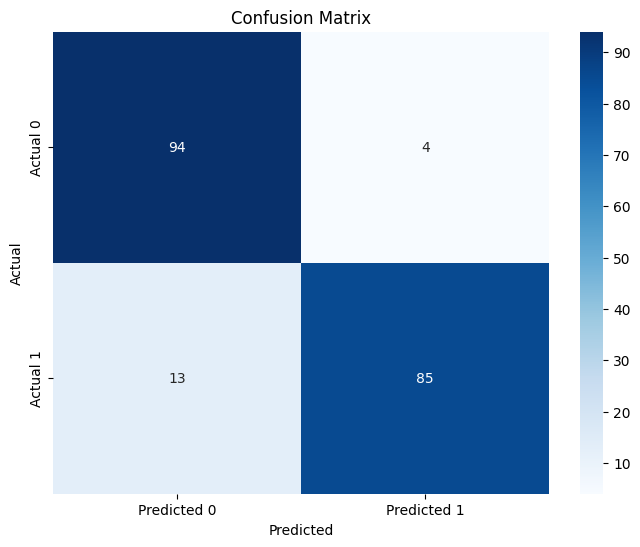

In [ ]:
from sklearn.metrics import accuracy_score, recall_score, f1_score, precision_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'df2' is your DataFrame with 'tj' (ground truth) and 'tj-gpt' (predictions)
y_true = df2['tj']
y_pred = df2['tj-gpt']

# Calculate metrics
accuracy = accuracy_score(y_true, y_pred)
recall = recall_score(y_true, y_pred, average='weighted')  # Use weighted average for multi-class
f1 = f1_score(y_true, y_pred, average='weighted')
precision = precision_score(y_true, y_pred, average='weighted')

print(f"Accuracy: {accuracy}")
print(f"Recall: {recall}")
print(f"F1-score: {f1}")
print(f"Precision: {precision}")

# Plot confusion matrix
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=['Predicted 0', 'Predicted 1'],
            yticklabels=['Actual 0', 'Actual 1'])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

#### TrustHub Taxonomy in System Prompt

In [ ]:
from openai import OpenAI
import os

## Set the API key and model name
MODEL="gpt-4o"
client = OpenAI(api_key=os.environ.get("OPENAI_API_KEY", "INSERT_API_KEY_HERE"))

def query_LLM(verilog):
  # Truncate the Verilog code to a maximum number of tokens
  max_input_tokens = 4000  # Adjust this value as needed
  verilog = verilog[:max_input_tokens]

  try:

    completion = client.chat.completions.create(
    model=MODEL,
    messages = [
    { "role": "system", "content": """You are a expert in hardware security and has extensive knowledge regarding hardware trojans in Verilog designs.
    A hardware Trojan is defined as a malicious, undesired and intentional modification made to an electronic circuit.
    Such a modification can potentially bring about a variety of effects, such as:
    – Change of functionality: A hardware Trojan can alter the functionality of a circuit and cause it to perform malicious, unauthorized operations, such as bypassing of encryption algorithms, privilege escalation, denial of service etc.
    – Degradation of performance: A hardware Trojan could also cause damage to the performance of an IC and cause it to fail, which could potentially jeopardize the (critical) system into which the IC is integrated. Such effects could be in the form of induced electromigration of wires by continuous DC stress, increase/decrease in path delay, fault injection etc.
    – Leakage of information: Trojans could also undermine the security provided by cryptographic algorithms or directly leak any sensitive information handled by the IC. This could involve leakage of cryptographic keys or other sensitive information through debug or I/O ports, side-channels (delay, power) etc.
    For example, consider this hardware trojan example found in TrustHub (AES-T2300):
    module aes_128(clk, rst, state, key, out);
    input          clk;
    input          rst;
    input  [127:0] state, key;
    output [127:0] out;
    wire   [127:0] out2;
    reg    [127:0] s0, k0;
    wire   [127:0] s1, s2, s3, s4, s5, s6, s7, s8, s9,
                   k1, k2, k3, k4, k5, k6, k7, k8, k9,
                   k0b, k1b, k2b, k3b, k4b, k5b, k6b, k7b, k8b, k9b;
    wire Tj_Trig;
    always @ (posedge clk)
      begin
        s0 <= state ^ key;
        k0 <= key;
      end
    expand_key_128
        a1 (clk, k0, k1, k0b, 8'h1),
        a2 (clk, k1, k2, k1b, 8'h2),
        a3 (clk, k2, k3, k2b, 8'h4),
        a4 (clk, k3, k4, k3b, 8'h8),
        a5 (clk, k4, k5, k4b, 8'h10),
        a6 (clk, k5, k6, k5b, 8'h20),
        a7 (clk, k6, k7, k6b, 8'h40),
        a8 (clk, k7, k8, k7b, 8'h80),
        a9 (clk, k8, k9, k8b, 8'h1b),
       a10 (clk, k9,   , k9b, 8'h36);
    one_round
        r1 (clk, s0, k0b, s1),
        r2 (clk, s1, k1b, s2),
        r3 (clk, s2, k2b, s3),
        r4 (clk, s3, k3b, s4),
        r5 (clk, s4, k4b, s5),
        r6 (clk, s5, k5b, s6),
        r7 (clk, s6, k6b, s7),
        r8 (clk, s7, k7b, s8),
        r9 (clk, s8, k8b, s9);
    final_round
        rf (clk, s9, k9b, out2);
    TSC Trojan(s2[89], s5[121], Tj_Trig);
    assign out[127:1] = out2[127:1];
    assign out[0] = out2[0] ^ Tj_Trig;
    endmodule
    module TSC(
        input r1,
        input r2,
      output trigger
        );
      assign trigger = r1 && r2;
      always @ (posedge trigger) 	$display("Trojan Activated");
    endmodule""" },
    { "role": "user", "content": "Given a Verilog design, evaluate if it has a trojan or not: " + verilog + """.
    Don't explain anything just answer with 1 if it probably has trojan or 0 otherwise.
    Do not deviate from the 0 or 1 answer pattern."""}
  ]
    )

    # Extract the content of the model's response
    response_content = completion.choices[0].message.content

    # Remove any non-digit characters from the response content
    response_content = ''.join(filter(str.isdigit, response_content))
    print(response_content)

    # Return the integer value or 0 if response is empty
    return int(response_content) if response_content else 0

  except Exception as e:
    print(f"An error occurred: {e}")
    return 0

In [ ]:
query_LLM(df2['text'][0])

0


0

In [ ]:
df2['tj-gpt'] = df2['text'].apply(query_LLM)

df2

0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
0
0
1
1
1
0
1
1
1
1
1
1
1
1
0
1
0
1
1

1
0
1
1
1
1
1
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
1
1
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
1
0
1
1
0
1
1
0
1
0
1
1
0
1
0
1
1
0
1
0
1
1
1


,text,tj,tj-gpt
0,\n\n\ntimescale 1ns / 1ps\n\nmodule usehint #(...,0,0
1,\n\ntimescale 1ns / 1ps\n\nmodule combined_top...,0,0
2,\n\n\ntimescale 1ns / 1ps\n\nmodule norm_check...,0,0
3,\n\n\ntimescale 1ns / 1ps\n\nmodule butterfly2...,0,0
4,\n\n\ntimescale 1ns / 1ps\n\n\nmodule rejectio...,0,0
...,...,...,...
191,"module FA(input a,b,cin,\n output c,s...",1,1
192,module addressgenerator (input clk...,1,0
193,"module div2(input [11:0] x,\n outpu...",1,1
194,"module KyberHPM16PE #(parameter PE_NUMBER=16,\...",1,1


Accuracy: 0.8724489795918368
Recall: 0.8724489795918368
F1-score: 0.8709677419354839
Precision: 0.890374331550802


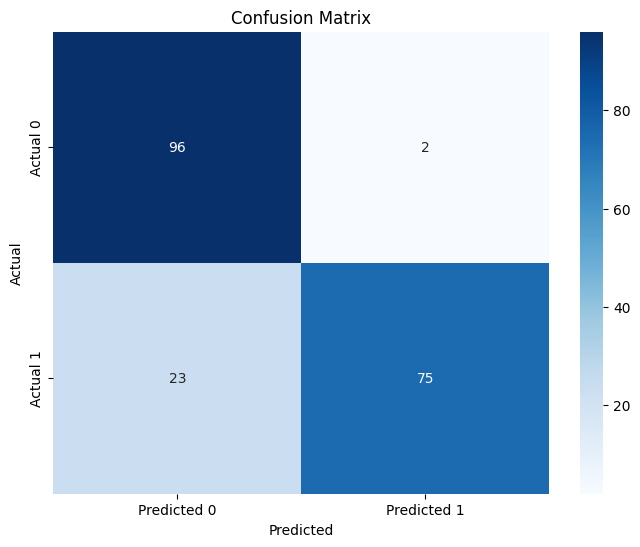

In [ ]:
from sklearn.metrics import accuracy_score, recall_score, f1_score, precision_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'df2' is your DataFrame with 'tj' (ground truth) and 'tj-gpt' (predictions)
y_true = df2['tj']
y_pred = df2['tj-gpt']

# Calculate metrics
accuracy = accuracy_score(y_true, y_pred)
recall = recall_score(y_true, y_pred, average='weighted')  # Use weighted average for multi-class
f1 = f1_score(y_true, y_pred, average='weighted')
precision = precision_score(y_true, y_pred, average='weighted')

print(f"Accuracy: {accuracy}")
print(f"Recall: {recall}")
print(f"F1-score: {f1}")
print(f"Precision: {precision}")

# Plot confusion matrix
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=['Predicted 0', 'Predicted 1'],
            yticklabels=['Actual 0', 'Actual 1'])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

### 2.2. Detection using Simple NLP Embedding TF-IDF and ML

#### PyCaret Setup

In [ ]:
! pip install pycaret

#### Obtain Full Dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd #Navigate to where the files are

In [ ]:
!ls

dataset-1.csv  dataset-2.csv  dataset-3.csv  logs.log


In [ ]:
import pandas as pd

df1 = pd.read_csv('dataset-1.csv')

df1

,Unnamed: 0,text,tj
0,0,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0
1,1,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0
2,2,"\nmodule s1423 ( CK, G0, G1, G10, G11, G12, G1...",0
3,3,"\nmodule s13207 ( CK, g1, g10, g1000, g1006, g...",0
4,4,"\nmodule s15850 ( CK, g100, g101, g102, g103, ...",0
...,...,...,...
1782,1782,// Modified UART TX Module with FIFO and a Da...,1
1783,1783,// Modified UART TX Module with FIFO and a Ti...,1
1784,1784,// Modified UART TX Module with FIFO and Cond...,1
1785,1785,// Modified UART TX Module with FIFO and Time...,1


In [ ]:
import pandas as pd

df2 = pd.read_csv('dataset-2.csv')

df2

,Unnamed: 0,text,tj
0,0,"/*\n * From our research paper ""High-Performan...",0
1,1,"/*\n * From our research paper ""High-Performan...",0
2,2,"/*\n * From our research paper ""High-Performan...",0
3,3,"/*\n * From our research paper ""High-Performan...",0
4,4,"/*\n * From our research paper ""High-Performan...",0
...,...,...,...
191,191,/*\nThe designers:\n\nAhmet Can Mert <ahmetcan...,1
192,192,/*\nThe designers:\n\nAhmet Can Mert <ahmetcan...,1
193,193,/*\nThe designers:\n\nAhmet Can Mert <ahmetcan...,1
194,194,/*\nThe designers:\n\nAhmet Can Mert <ahmetcan...,1


In [ ]:
import pandas as pd

df3 = pd.read_csv('dataset-3.csv')

df3

,Unnamed: 0,text,tj
0,0,\n\n\ntimescale 1ns / 1ps\n\nmodule usehint #(...,0
1,1,\n\ntimescale 1ns / 1ps\n\nmodule combined_top...,0
2,2,\n\n\ntimescale 1ns / 1ps\n\nmodule norm_check...,0
3,3,\n\n\ntimescale 1ns / 1ps\n\nmodule butterfly2...,0
4,4,\n\n\ntimescale 1ns / 1ps\n\n\nmodule rejectio...,0
...,...,...,...
191,191,"module FA(input a,b,cin,\n output c,s...",1
192,192,module addressgenerator (input clk...,1
193,193,"module div2(input [11:0] x,\n outpu...",1
194,194,"module KyberHPM16PE #(parameter PE_NUMBER=16,\...",1


In [ ]:
# Concatenate the dataframes
df = pd.concat([df1, df2, df3], ignore_index=True)

# Display the combined dataframe
df

,Unnamed: 0,text,tj
0,0,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0
1,1,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0
2,2,"\nmodule s1423 ( CK, G0, G1, G10, G11, G12, G1...",0
3,3,"\nmodule s13207 ( CK, g1, g10, g1000, g1006, g...",0
4,4,"\nmodule s15850 ( CK, g100, g101, g102, g103, ...",0
...,...,...,...
2174,191,"module FA(input a,b,cin,\n output c,s...",1
2175,192,module addressgenerator (input clk...,1
2176,193,"module div2(input [11:0] x,\n outpu...",1
2177,194,"module KyberHPM16PE #(parameter PE_NUMBER=16,\...",1


In [ ]:
if 'Unnamed: 0' in df.columns:
  df = df.drop(columns=['Unnamed: 0'])

df

,text,tj
0,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0
1,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0
2,"\nmodule s1423 ( CK, G0, G1, G10, G11, G12, G1...",0
3,"\nmodule s13207 ( CK, g1, g10, g1000, g1006, g...",0
4,"\nmodule s15850 ( CK, g100, g101, g102, g103, ...",0
...,...,...
2174,"module FA(input a,b,cin,\n output c,s...",1
2175,module addressgenerator (input clk...,1
2176,"module div2(input [11:0] x,\n outpu...",1
2177,"module KyberHPM16PE #(parameter PE_NUMBER=16,\...",1


#### Balance Dataset with Oversampling

In [ ]:
df_tj_0 = df[df['tj'] == 0]
df_tj_1 = df[df['tj'] == 1]

n_samples_tj_1 = len(df_tj_1)

while len(df_tj_0) < n_samples_tj_1:
    df_tj_0 = pd.concat([df_tj_0, df_tj_0])

df_tj_0 = df_tj_0.iloc[:n_samples_tj_1]

df1 = pd.concat([df_tj_0, df_tj_1]).reset_index(drop=True)

df1

In [ ]:
df['tj'].value_counts()

,count
tj,
1,1904
0,275


In [ ]:
df1['tj'].value_counts()

,count
tj,
0,1904
1,1904


#### Remove Verilog Comments

In [ ]:
def clean_verilog(verilog_code):
  """Removes single-line and multi-line comments from Verilog code.

  Args:
    verilog_code: The Verilog code as a string.

  Returns:
    The Verilog code with comments removed.
  """
  import re

  verilog_code = re.sub(r"verilog\n", "", verilog_code)
  verilog_code = re.sub(r"`", "", verilog_code)

  # Remove multi-line comments (/*...*/)
  verilog_code = re.sub(r"/\*.*?\*/", "", verilog_code, flags=re.DOTALL)

  return verilog_code

In [ ]:
df1['text'] = df1['text'].apply(clean_verilog)

df1

,text,tj
0,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0
1,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0
2,"\nmodule s1423 ( CK, G0, G1, G10, G11, G12, G1...",0
3,"\nmodule s13207 ( CK, g1, g10, g1000, g1006, g...",0
4,"\nmodule s15850 ( CK, g100, g101, g102, g103, ...",0
...,...,...
3803,"module FA(input a,b,cin,\n output c,s...",1
3804,module addressgenerator (input clk...,1
3805,"module div2(input [11:0] x,\n outpu...",1
3806,"module KyberHPM16PE #(parameter PE_NUMBER=16,\...",1


#### TF-IDF Word Embeddings

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Create a TfidfVectorizer with a maximum vocabulary size of 1000
vectorizer = TfidfVectorizer(max_features=1000)

# Fit and transform the 'text' column of df1
tfidf_matrix = vectorizer.fit_transform(df1['text'])

tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=vectorizer.get_feature_names_out())

# Add the 'tj' column from df1 to the new DataFrame
tfidf_df['tj'] = df1['tj']

In [ ]:
tfidf_df['tj'].value_counts()

,count
tj,
0,1904
1,1904


#### Train and Evaluate ML Binary Classifiers

In [ ]:
# init setup
from pycaret.classification import *

In [ ]:
s = setup(tfidf_df, target = 'tj', session_id = 123, fold = 10)

,Description,Value
0,Session id,123
1,Target,tj
2,Target type,Binary
3,Original data shape,"(3808, 1001)"
4,Transformed data shape,"(3808, 1001)"
5,Transformed train set shape,"(2665, 1001)"
6,Transformed test set shape,"(1143, 1001)"
7,Numeric features,1000
8,Preprocess,True
9,Imputation type,simple


In [ ]:
# model training and selection
best = compare_models(errors = 'raise')

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
et,Extra Trees Classifier,0.9726,0.9999,0.9460,0.9992,0.9718,0.9452,0.9466,0.9390
dt,Decision Tree Classifier,0.9711,0.9711,0.9429,0.9992,0.9702,0.9422,0.9438,0.4110
lightgbm,Light Gradient Boosting Machine,0.9704,0.9936,0.9415,0.9992,0.9694,0.9407,0.9424,10.8190
xgboost,Extreme Gradient Boosting,0.9700,0.9916,0.9407,0.9992,0.9690,0.9400,0.9417,5.3460
rf,Random Forest Classifier,0.9662,0.9991,0.9332,0.9992,0.9650,0.9325,0.9346,1.2020
gbc,Gradient Boosting Classifier,0.9565,0.9799,0.9182,0.9944,0.9547,0.9130,0.9158,9.7470
knn,K Neighbors Classifier,0.9430,0.9591,0.9017,0.9832,0.9405,0.8859,0.8893,0.3330
ada,Ada Boost Classifier,0.9370,0.9712,0.9092,0.9632,0.9352,0.8739,0.8756,2.1370
svm,SVM - Linear Kernel,0.8856,0.9218,0.8544,0.9119,0.8816,0.7711,0.7735,0.5820
ridge,Ridge Classifier,0.8833,0.9263,0.8537,0.9084,0.8797,0.7666,0.7687,0.2830


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

In [ ]:
tfidf_df

,10,11,12,13,15,16,23,24,31,32,...,tjkey,tjload,wb_clk_i,wire,xnr2s3,xor2_x1,xor2s1,xor2s3,zn,tj
0,0.000475,0.000542,0.000468,0.000518,0.000493,0.000435,0.000252,0.000108,0.000109,0.0,...,0.0,0.0,0.267484,0.000115,0.000000,0.0,0.0,0.000000,0.0,0
1,0.000475,0.000542,0.000468,0.000518,0.000493,0.000435,0.000252,0.000108,0.000109,0.0,...,0.0,0.0,0.267469,0.000115,0.000000,0.0,0.0,0.000000,0.0,0
2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,...,0.0,0.0,0.000000,0.000910,0.068276,0.0,0.0,0.002354,0.0,0
3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,...,0.0,0.0,0.000000,0.000172,0.009318,0.0,0.0,0.048810,0.0,0
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,...,0.0,0.0,0.000000,0.000145,0.006397,0.0,0.0,0.050796,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3803,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,...,0.0,0.0,0.000000,0.298529,0.000000,0.0,0.0,0.000000,0.0,1
3804,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,...,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,1
3805,0.223673,0.930423,0.105778,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,...,0.0,0.0,0.000000,0.094749,0.000000,0.0,0.0,0.000000,0.0,1
3806,0.173874,0.602726,0.246681,0.181981,0.160447,0.193974,0.154489,0.167869,0.150915,0.0,...,0.0,0.0,0.000000,0.208685,0.000000,0.0,0.0,0.000000,0.0,1


Confusion Matrix:
 [[408   0]
 [ 17 337]]
F1-score: 0.975397973950796
Accuracy: 0.9776902887139107
Precision: 1.0


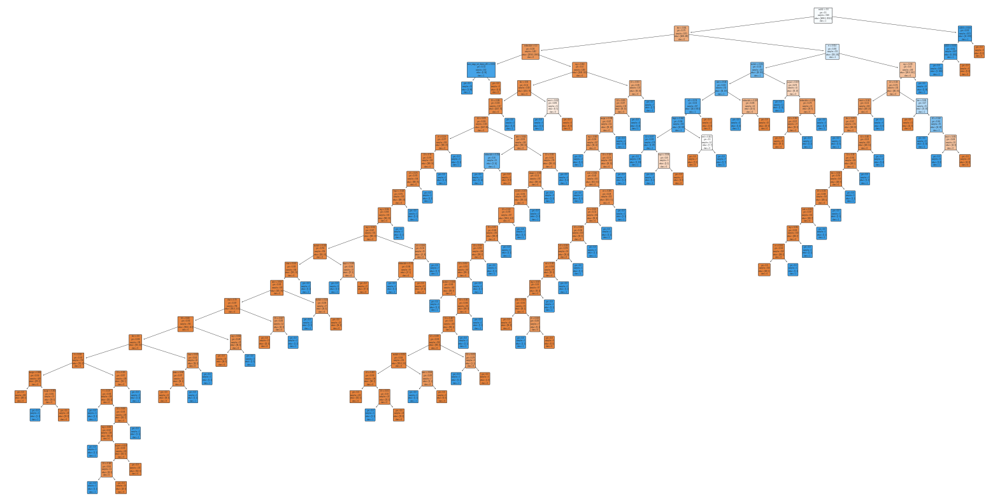

In [ ]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, f1_score, accuracy_score, precision_score
from sklearn.model_selection import train_test_split

# Assuming 'tfidf_df' is your DataFrame with TF-IDF features and 'tj' as the target variable

# Separate features (X) and target (y)
X = tfidf_df.drop('tj', axis=1)
y = tfidf_df['tj']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train a Decision Tree classifier
dt_classifier = DecisionTreeClassifier(random_state=42)  # You can adjust hyperparameters here
dt_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = dt_classifier.predict(X_test)

# Evaluate the model
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("F1-score:", f1_score(y_test, y_pred))
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Precision:", precision_score(y_test, y_pred))

# Plot the decision tree
plt.figure(figsize=(20, 10))
plot_tree(dt_classifier, filled=True, feature_names=X.columns, class_names=['0', '1'], rounded=True)
plt.show()

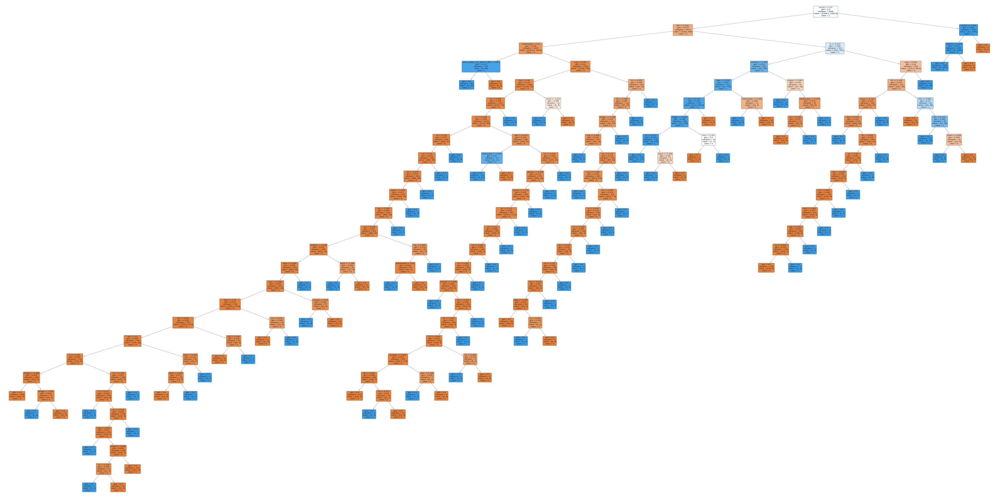

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Increase the figure size for better visualization
plt.figure(figsize=(50, 25))  # Adjust these values as needed

# Plot the decision tree with improved settings
plot_tree(dt_classifier,
          filled=True,
          feature_names=X.columns,
          class_names=['0', '1'],
          rounded=True,
          fontsize=6) # Adjust fontsize as necessary

# Save the plot to a file (e.g., PNG) in high quality
plt.savefig('decision_tree_visualization.png', dpi=600, bbox_inches='tight') # dpi controls resolution


# Show the plot (optional, might be large to display)
plt.show()


# Download the saved image
from google.colab import files
files.download('decision_tree_visualization.png')

### 2.3. Detection using Olmo-2B Open-source LLM Embedding and ML

#### Olmo LLM Setup

In [ ]:
! pip install ai2-olmo

In [ ]:
!pip install datasets

In [ ]:
! pip install pycaret

#### Obtain Full Dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd #Navigate to where the files are

In [ ]:
!ls

dataset-1.csv  dataset-2.csv  dataset-3.csv  decision_tree_visualization.png  logs.log


In [ ]:
import pandas as pd

df1 = pd.read_csv('dataset-1.csv')

df1

,Unnamed: 0,text,tj
0,0,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0
1,1,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0
2,2,"\nmodule s1423 ( CK, G0, G1, G10, G11, G12, G1...",0
3,3,"\nmodule s13207 ( CK, g1, g10, g1000, g1006, g...",0
4,4,"\nmodule s15850 ( CK, g100, g101, g102, g103, ...",0
...,...,...,...
1782,1782,// Modified UART TX Module with FIFO and a Da...,1
1783,1783,// Modified UART TX Module with FIFO and a Ti...,1
1784,1784,// Modified UART TX Module with FIFO and Cond...,1
1785,1785,// Modified UART TX Module with FIFO and Time...,1


In [ ]:
import pandas as pd

df2 = pd.read_csv('dataset-2.csv')

df2

,Unnamed: 0,text,tj
0,0,"/*\n * From our research paper ""High-Performan...",0
1,1,"/*\n * From our research paper ""High-Performan...",0
2,2,"/*\n * From our research paper ""High-Performan...",0
3,3,"/*\n * From our research paper ""High-Performan...",0
4,4,"/*\n * From our research paper ""High-Performan...",0
...,...,...,...
191,191,/*\nThe designers:\n\nAhmet Can Mert <ahmetcan...,1
192,192,/*\nThe designers:\n\nAhmet Can Mert <ahmetcan...,1
193,193,/*\nThe designers:\n\nAhmet Can Mert <ahmetcan...,1
194,194,/*\nThe designers:\n\nAhmet Can Mert <ahmetcan...,1


In [ ]:
import pandas as pd

df3 = pd.read_csv('dataset-3.csv')

df3

,Unnamed: 0,text,tj
0,0,\n\n\ntimescale 1ns / 1ps\n\nmodule usehint #(...,0
1,1,\n\ntimescale 1ns / 1ps\n\nmodule combined_top...,0
2,2,\n\n\ntimescale 1ns / 1ps\n\nmodule norm_check...,0
3,3,\n\n\ntimescale 1ns / 1ps\n\nmodule butterfly2...,0
4,4,\n\n\ntimescale 1ns / 1ps\n\n\nmodule rejectio...,0
...,...,...,...
191,191,"module FA(input a,b,cin,\n output c,s...",1
192,192,module addressgenerator (input clk...,1
193,193,"module div2(input [11:0] x,\n outpu...",1
194,194,"module KyberHPM16PE #(parameter PE_NUMBER=16,\...",1


In [ ]:
# Concatenate the dataframes
df = pd.concat([df1, df2, df3], ignore_index=True)

# Display the combined dataframe
df

,Unnamed: 0,text,tj
0,0,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0
1,1,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0
2,2,"\nmodule s1423 ( CK, G0, G1, G10, G11, G12, G1...",0
3,3,"\nmodule s13207 ( CK, g1, g10, g1000, g1006, g...",0
4,4,"\nmodule s15850 ( CK, g100, g101, g102, g103, ...",0
...,...,...,...
2174,191,"module FA(input a,b,cin,\n output c,s...",1
2175,192,module addressgenerator (input clk...,1
2176,193,"module div2(input [11:0] x,\n outpu...",1
2177,194,"module KyberHPM16PE #(parameter PE_NUMBER=16,\...",1


In [ ]:
if 'Unnamed: 0' in df.columns:
  df = df.drop(columns=['Unnamed: 0'])

df

,text,tj
0,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0
1,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0
2,"\nmodule s1423 ( CK, G0, G1, G10, G11, G12, G1...",0
3,"\nmodule s13207 ( CK, g1, g10, g1000, g1006, g...",0
4,"\nmodule s15850 ( CK, g100, g101, g102, g103, ...",0
...,...,...
2174,"module FA(input a,b,cin,\n output c,s...",1
2175,module addressgenerator (input clk...,1
2176,"module div2(input [11:0] x,\n outpu...",1
2177,"module KyberHPM16PE #(parameter PE_NUMBER=16,\...",1


#### Balance Dataset with Oversampling

In [ ]:
df_tj_0 = df[df['tj'] == 0]
df_tj_1 = df[df['tj'] == 1]

n_samples_tj_1 = len(df_tj_1)

while len(df_tj_0) < n_samples_tj_1:
    df_tj_0 = pd.concat([df_tj_0, df_tj_0])

df_tj_0 = df_tj_0.iloc[:n_samples_tj_1]

df1 = pd.concat([df_tj_0, df_tj_1]).reset_index(drop=True)

df1

,text,tj
0,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0
1,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0
2,"\nmodule s1423 ( CK, G0, G1, G10, G11, G12, G1...",0
3,"\nmodule s13207 ( CK, g1, g10, g1000, g1006, g...",0
4,"\nmodule s15850 ( CK, g100, g101, g102, g103, ...",0
...,...,...
3803,"module FA(input a,b,cin,\n output c,s...",1
3804,module addressgenerator (input clk...,1
3805,"module div2(input [11:0] x,\n outpu...",1
3806,"module KyberHPM16PE #(parameter PE_NUMBER=16,\...",1


In [ ]:
df['tj'].value_counts()

,count
tj,
1,1904
0,275


In [ ]:
df1['tj'].value_counts()

,count
tj,
0,1904
1,1904


#### Remove Comments

In [ ]:
def clean_verilog(verilog_code):
  """Removes single-line and multi-line comments from Verilog code.

  Args:
    verilog_code: The Verilog code as a string.

  Returns:
    The Verilog code with comments removed.
  """
  import re

  verilog_code = re.sub(r"verilog\n", "", verilog_code)
  verilog_code = re.sub(r"`", "", verilog_code)

  # Remove multi-line comments (/*...*/)
  verilog_code = re.sub(r"/\*.*?\*/", "", verilog_code, flags=re.DOTALL)

  return verilog_code

In [ ]:
df1['text'] = df1['text'].apply(clean_verilog)

df1

,text,tj
0,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0
1,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0
2,"\nmodule s1423 ( CK, G0, G1, G10, G11, G12, G1...",0
3,"\nmodule s13207 ( CK, g1, g10, g1000, g1006, g...",0
4,"\nmodule s15850 ( CK, g100, g101, g102, g103, ...",0
...,...,...
3803,"module FA(input a,b,cin,\n output c,s...",1
3804,module addressgenerator (input clk...,1
3805,"module div2(input [11:0] x,\n outpu...",1
3806,"module KyberHPM16PE #(parameter PE_NUMBER=16,\...",1


In [ ]:
all_data = df1['text'].tolist()

#### Tokenize using LLM

In [ ]:
import torch
import hf_olmo

from transformers import AutoTokenizer, AutoModelForCausalLM

if torch.cuda.is_available():
    device = torch.device("cuda")
    print("Using GPU")
else:
    device = torch.device("cpu")
    print("Using CPU")

tokenizer = AutoTokenizer.from_pretrained("allenai/OLMo-1B")

if tokenizer.pad_token is None:
    tokenizer.add_special_tokens({'pad_token': '[PAD]'})

prompt = all_data

input_ids = tokenizer(prompt, return_tensors="pt", padding='max_length', truncation=True, max_length=1000).input_ids.to(device)

#print(len(input_ids[0]))

#print(input_ids)

Using GPU


tokenizer_config.json:   0%|          | 0.00/5.49k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.12M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/65.0 [00:00<?, ?B/s]

In [ ]:
import pandas as  pd

df = pd.DataFrame(input_ids.cpu().numpy())

df['tj'] = df1['tj']

df

,0,1,2,3,4,5,6,7,8,9,...,991,992,993,994,995,996,997,998,999,tj
0,187,8640,362,2485,64,17305,64,3956,64,14279,...,1042,19,9,79,20,582,964,1042,20,0
1,187,8640,362,2485,64,17305,64,3956,64,14279,...,1042,19,9,79,20,582,964,1042,20,0
2,187,8640,256,1047,1508,313,17939,13,443,17,...,20360,13,295,17537,13,295,14832,13,295,0
3,187,8640,256,1012,18202,313,17939,13,305,18,...,305,25654,13,305,25953,13,305,25020,13,0
4,187,8640,256,18663,1235,313,17939,13,305,2313,...,4196,13,305,1166,361,13,187,50269,72,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3803,8640,10601,9,5423,247,13,67,13,5620,13,...,1,1,1,1,1,1,1,1,1,1
3804,8640,2953,36089,313,5423,50265,18255,13,19511,13,...,187,50266,282,518,11049,470,28,187,50274,1
3805,8640,2017,19,9,5423,544,883,27,17,62,...,1,1,1,1,1,1,1,1,1,1
3806,8640,18009,589,41,9122,1036,3246,1852,9,19484,...,64,21771,4490,10,3857,313,412,64,14340,1


#### Train and Evaluate ML Binary Classifiers

In [ ]:
# init setup
from pycaret.classification import *

In [ ]:
s = setup(df, target = 'tj', session_id = 123, fold = 10)

,Description,Value
0,Session id,123
1,Target,tj
2,Target type,Binary
3,Original data shape,"(3808, 1001)"
4,Transformed data shape,"(3808, 1001)"
5,Transformed train set shape,"(2665, 1001)"
6,Transformed test set shape,"(1143, 1001)"
7,Numeric features,1000
8,Preprocess,True
9,Imputation type,simple


In [ ]:
# model training and selection
best = compare_models(errors = 'raise')

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
xgboost,Extreme Gradient Boosting,0.9621,0.9784,0.9663,0.9584,0.9623,0.9242,0.9243,2.0700
lightgbm,Light Gradient Boosting Machine,0.9610,0.9801,0.9640,0.9584,0.9611,0.9220,0.9221,150.6090
et,Extra Trees Classifier,0.9602,0.9741,0.9640,0.9570,0.9604,0.9205,0.9206,0.3720
gbc,Gradient Boosting Classifier,0.9520,0.9709,0.9460,0.9577,0.9517,0.9039,0.9041,5.6680
rf,Random Forest Classifier,0.9508,0.9747,0.9422,0.9589,0.9504,0.9017,0.9019,0.5060
dt,Decision Tree Classifier,0.9482,0.9566,0.9393,0.9565,0.9477,0.8964,0.8968,0.2940
lr,Logistic Regression,0.9449,0.9587,0.9310,0.9577,0.9440,0.8897,0.8903,1.2690
lda,Linear Discriminant Analysis,0.9321,0.9328,0.9092,0.9532,0.9305,0.8642,0.8654,0.3840
ridge,Ridge Classifier,0.9302,0.9362,0.9055,0.9529,0.9284,0.8604,0.8618,0.1180
svm,SVM - Linear Kernel,0.9219,0.9482,0.8919,0.9491,0.9189,0.8439,0.8464,0.1900


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

### 2.4. Detection using Meta Llama-3.3-70B Open-source LLM with Prompt Optimization

#### Obtain Full Dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/MyDrive/Colab Notebooks/FULL_benchmarks_Verilog/

/content/drive/MyDrive/Colab Notebooks/FULL_benchmarks_Verilog


In [ ]:
!ls

dataset-1.csv  dataset-2.csv  dataset-3.csv  decision_tree_visualization.png  logs.log


In [ ]:
import pandas as pd

df1 = pd.read_csv('dataset-1.csv')

df1

,Unnamed: 0,text,tj
0,0,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0
1,1,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0
2,2,"\nmodule s1423 ( CK, G0, G1, G10, G11, G12, G1...",0
3,3,"\nmodule s13207 ( CK, g1, g10, g1000, g1006, g...",0
4,4,"\nmodule s15850 ( CK, g100, g101, g102, g103, ...",0
...,...,...,...
1782,1782,// Modified UART TX Module with FIFO and a Da...,1
1783,1783,// Modified UART TX Module with FIFO and a Ti...,1
1784,1784,// Modified UART TX Module with FIFO and Cond...,1
1785,1785,// Modified UART TX Module with FIFO and Time...,1


In [ ]:
import pandas as pd

df2 = pd.read_csv('dataset-2.csv')

df2

,Unnamed: 0,text,tj
0,0,"/*\n * From our research paper ""High-Performan...",0
1,1,"/*\n * From our research paper ""High-Performan...",0
2,2,"/*\n * From our research paper ""High-Performan...",0
3,3,"/*\n * From our research paper ""High-Performan...",0
4,4,"/*\n * From our research paper ""High-Performan...",0
...,...,...,...
191,191,/*\nThe designers:\n\nAhmet Can Mert <ahmetcan...,1
192,192,/*\nThe designers:\n\nAhmet Can Mert <ahmetcan...,1
193,193,/*\nThe designers:\n\nAhmet Can Mert <ahmetcan...,1
194,194,/*\nThe designers:\n\nAhmet Can Mert <ahmetcan...,1


In [ ]:
import pandas as pd

df3 = pd.read_csv('dataset-3.csv')

df3

,Unnamed: 0,text,tj
0,0,\n\n\ntimescale 1ns / 1ps\n\nmodule usehint #(...,0
1,1,\n\ntimescale 1ns / 1ps\n\nmodule combined_top...,0
2,2,\n\n\ntimescale 1ns / 1ps\n\nmodule norm_check...,0
3,3,\n\n\ntimescale 1ns / 1ps\n\nmodule butterfly2...,0
4,4,\n\n\ntimescale 1ns / 1ps\n\n\nmodule rejectio...,0
...,...,...,...
191,191,"module FA(input a,b,cin,\n output c,s...",1
192,192,module addressgenerator (input clk...,1
193,193,"module div2(input [11:0] x,\n outpu...",1
194,194,"module KyberHPM16PE #(parameter PE_NUMBER=16,\...",1


In [ ]:
# Concatenate the dataframes
df = pd.concat([df1, df2, df3], ignore_index=True)

# Display the combined dataframe
df

,Unnamed: 0,text,tj
0,0,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0
1,1,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0
2,2,"\nmodule s1423 ( CK, G0, G1, G10, G11, G12, G1...",0
3,3,"\nmodule s13207 ( CK, g1, g10, g1000, g1006, g...",0
4,4,"\nmodule s15850 ( CK, g100, g101, g102, g103, ...",0
...,...,...,...
2174,191,"module FA(input a,b,cin,\n output c,s...",1
2175,192,module addressgenerator (input clk...,1
2176,193,"module div2(input [11:0] x,\n outpu...",1
2177,194,"module KyberHPM16PE #(parameter PE_NUMBER=16,\...",1


In [ ]:
if 'Unnamed: 0' in df.columns:
  df = df.drop(columns=['Unnamed: 0'])

df

,text,tj
0,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0
1,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0
2,"\nmodule s1423 ( CK, G0, G1, G10, G11, G12, G1...",0
3,"\nmodule s13207 ( CK, g1, g10, g1000, g1006, g...",0
4,"\nmodule s15850 ( CK, g100, g101, g102, g103, ...",0
...,...,...
2174,"module FA(input a,b,cin,\n output c,s...",1
2175,module addressgenerator (input clk...,1
2176,"module div2(input [11:0] x,\n outpu...",1
2177,"module KyberHPM16PE #(parameter PE_NUMBER=16,\...",1


#### Balance Dataset with Oversampling

In [ ]:
df_tj_0 = df[df['tj'] == 0]
df_tj_1 = df[df['tj'] == 1]

n_samples_tj_1 = len(df_tj_1)

while len(df_tj_0) < n_samples_tj_1:
    df_tj_0 = pd.concat([df_tj_0, df_tj_0])

df_tj_0 = df_tj_0.iloc[:n_samples_tj_1]

df1 = pd.concat([df_tj_0, df_tj_1]).reset_index(drop=True)

df1

,text,tj
0,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0
1,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0
2,"\nmodule s1423 ( CK, G0, G1, G10, G11, G12, G1...",0
3,"\nmodule s13207 ( CK, g1, g10, g1000, g1006, g...",0
4,"\nmodule s15850 ( CK, g100, g101, g102, g103, ...",0
...,...,...
3803,"module FA(input a,b,cin,\n output c,s...",1
3804,module addressgenerator (input clk...,1
3805,"module div2(input [11:0] x,\n outpu...",1
3806,"module KyberHPM16PE #(parameter PE_NUMBER=16,\...",1


In [ ]:
df['tj'].value_counts()

,count
tj,
1,1904
0,275


In [ ]:
df1['tj'].value_counts()

,count
tj,
0,1904
1,1904


#### Remove Comments

In [ ]:
def clean_verilog(verilog_code):
  """Removes single-line and multi-line comments from Verilog code.

  Args:
    verilog_code: The Verilog code as a string.

  Returns:
    The Verilog code with comments removed.
  """
  import re

  verilog_code = re.sub(r"verilog\n", "", verilog_code)
  verilog_code = re.sub(r"`", "", verilog_code)

  # Remove multi-line comments (/*...*/)
  verilog_code = re.sub(r"/\*.*?\*/", "", verilog_code, flags=re.DOTALL)

  return verilog_code

In [ ]:
df1['text'] = df1['text'].apply(clean_verilog)

df1

,text,tj
0,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0
1,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0
2,"\nmodule s1423 ( CK, G0, G1, G10, G11, G12, G1...",0
3,"\nmodule s13207 ( CK, g1, g10, g1000, g1006, g...",0
4,"\nmodule s15850 ( CK, g100, g101, g102, g103, ...",0
...,...,...
3803,"module FA(input a,b,cin,\n output c,s...",1
3804,module addressgenerator (input clk...,1
3805,"module div2(input [11:0] x,\n outpu...",1
3806,"module KyberHPM16PE #(parameter PE_NUMBER=16,\...",1


#### Simple Prompt

In [ ]:
from huggingface_hub import InferenceClient

model_id="meta-llama/Llama-3.3-70B-Instruct"
client = InferenceClient(api_key="INSERT_API_KEY_HERE")

def query_LLM(verilog):

  # Truncate the Verilog code to a maximum number of tokens
  max_input_tokens = 3500  # Adjust this value as needed
  verilog = verilog[:max_input_tokens]

  messages = [
      { "role": "system", "content": "You are a expert in hardware security and has extensive knowledge regarding hardware trojans in Verilog designs. Given a Verilog design, you can only answer with 1 if it has trojan or 0 otherwise. Do not deviate from the 0 or 1 answer pattern." },
      { "role": "user", "content": "Evaluate if the following Verilog design has a trojan or not, only return numerical value based on your analysis: " + verilog }
      ]

  output = client.chat.completions.create(
    model="meta-llama/Llama-3.3-70B-Instruct",
    messages=messages,
    temperature=0.5,
    max_tokens=10,
    top_p=0.5
  )

  # Extract the content of the model's response
  response_content = output.choices[0].message['content']
  print(response_content)

  # Remove any non-digit characters from the response content
  response_content = ''.join(filter(str.isdigit, response_content))
  #print(response_content)

  # Return the integer value or 0 if response is empty
  return int(response_content[0]) if response_content else 0

In [ ]:
query_LLM(df1['text'][0])

1


1

In [ ]:
df1['tj-llama3-3-simple'] = df1['text'].apply(query_LLM)

df1

1
1
1
1
1
0
0
0
1
1
1
1
1
1
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
1
1
0
0
0
0
0
1
0
0
0
1
1
1
1
1
1
0
1
1
0
0
0
1
0
0
0
0
0
1
0
1
0
0
1
0
1
0
1
0
1
0
0
0
1
1
0
1
0
1
0
1
1
0
1
0
0
1
1
0
1
0
1
1
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
0
1
0
1
1
1
0
0
0
0
0
1
0
0
1
0
1
1
0
0
1
0
1
0
1
0
1
0
0
0
1
1
0
1
0
1
0
1
1
0
0
0
0
1
1
0
1
0
0
1
0
0
1
1
0
0
0
1
1
1
0
0
1
0
1
1
0
0
0
1
0
0
1
0
1
1
1
0
1
0
0
0
1
1
0
0
1
0
0
1
1
1
1
1
0
0
1
0
0
1
0
1
1
1
0
0
0
0
0
1
0
0
1
0
1
1
1
1
1
1
0
0
0
1
1
1
1
1
1
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
1
1
0
0
0
0
0
1
0
0
0
1
1
1
1
1
1
0
1
1
0
0
0
1
0
0
0
0
0
1
0
1
0
0
1
0
1
0
1
0
1
0
0
0
1
1
0
1
0
1
0
1
1
0
1
0
0
1
1
0
1
0
1
1
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
0
1
0
1
1
1
0
0
0
0
0
1
0
0
1
0
1
1
0
0
1
0
1
0
1
0
1
0
0
0
1
1
0
1
0
1
0
1
1
0
0
0
0
1
1
0
1
0
0
1
0
0
1
1
0
0
0
1
1
1
0
0
1
0
1


,text,tj,tj-llama-simple,tj-llama3-3-simple
0,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0,0,1
1,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0,0,1
2,"\nmodule s1423 ( CK, G0, G1, G10, G11, G12, G1...",0,1,1
3,"\nmodule s13207 ( CK, g1, g10, g1000, g1006, g...",0,1,1
4,"\nmodule s15850 ( CK, g100, g101, g102, g103, ...",0,1,1
...,...,...,...,...
3803,"module FA(input a,b,cin,\n output c,s...",1,1,1
3804,module addressgenerator (input clk...,1,1,1
3805,"module div2(input [11:0] x,\n outpu...",1,1,1
3806,"module KyberHPM16PE #(parameter PE_NUMBER=16,\...",1,1,1


Accuracy: 0.7111344537815126
Recall: 0.8813025210084033
F1-Score: 0.7531418312387792
Precision: 0.6575235109717869


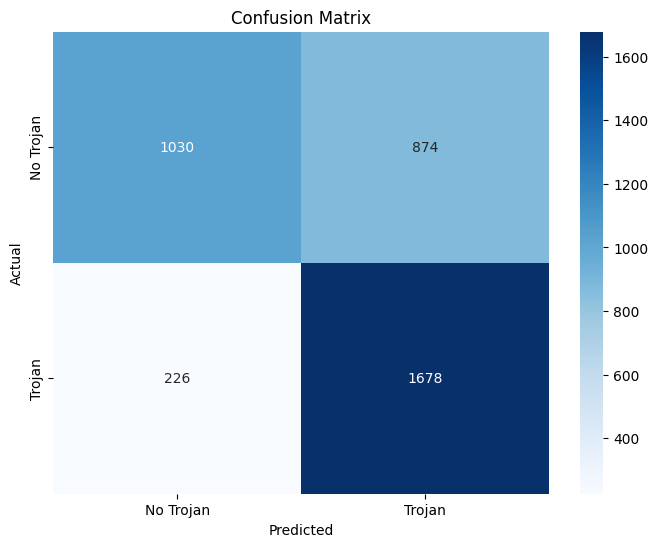

In [ ]:
from sklearn.metrics import accuracy_score, recall_score, f1_score, precision_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df1 is your DataFrame with 'tj' (ground truth) and 'tj-llama' (predictions)

y_true = df1['tj']
y_pred = df1['tj-llama3-3-simple']

accuracy = accuracy_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)
f1 = f1_score(y_true, y_pred)
precision = precision_score(y_true, y_pred)

print(f"Accuracy: {accuracy}")
print(f"Recall: {recall}")
print(f"F1-Score: {f1}")
print(f"Precision: {precision}")

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['No Trojan', 'Trojan'],
            yticklabels=['No Trojan', 'Trojan'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

#### TrustHub Trojan Definition and Example

In [ ]:
from huggingface_hub import InferenceClient

model_id="meta-llama/Llama-3.3-70B-Instruct"
client = InferenceClient(api_key="INSERT_API_KEY_HERE")

def query_LLM(verilog):

  # Truncate the Verilog code to a maximum number of tokens
  max_input_tokens = 3500  # Adjust this value as needed
  verilog = verilog[:max_input_tokens]

  messages = [
    { "role": "system", "content": """You are a expert in hardware security and has extensive knowledge regarding hardware trojans in Verilog designs.
    A hardware Trojan is defined as a malicious, undesired and intentional modification made to an electronic circuit.
    Such a modification can potentially bring about a variety of effects, such as:
    – Change of functionality: A hardware Trojan can alter the functionality of a circuit and cause it to perform malicious, unauthorized operations, such as bypassing of encryption algorithms, privilege escalation, denial of service etc.
    – Degradation of performance: A hardware Trojan could also cause damage to the performance of an IC and cause it to fail, which could potentially jeopardize the (critical) system into which the IC is integrated. Such effects could be in the form of induced electromigration of wires by continuous DC stress, increase/decrease in path delay, fault injection etc.
    – Leakage of information: Trojans could also undermine the security provided by cryptographic algorithms or directly leak any sensitive information handled by the IC. This could involve leakage of cryptographic keys or other sensitive information through debug or I/O ports, side-channels (delay, power) etc.
    For example, consider this hardware trojan example found in TrustHub (AES-T2300):
    module aes_128(clk, rst, state, key, out);
    input          clk;
    input          rst;
    input  [127:0] state, key;
    output [127:0] out;
    wire   [127:0] out2;
    reg    [127:0] s0, k0;
    wire   [127:0] s1, s2, s3, s4, s5, s6, s7, s8, s9,
                   k1, k2, k3, k4, k5, k6, k7, k8, k9,
                   k0b, k1b, k2b, k3b, k4b, k5b, k6b, k7b, k8b, k9b;
    wire Tj_Trig;
    always @ (posedge clk)
      begin
        s0 <= state ^ key;
        k0 <= key;
      end
    expand_key_128
        a1 (clk, k0, k1, k0b, 8'h1),
        a2 (clk, k1, k2, k1b, 8'h2),
        a3 (clk, k2, k3, k2b, 8'h4),
        a4 (clk, k3, k4, k3b, 8'h8),
        a5 (clk, k4, k5, k4b, 8'h10),
        a6 (clk, k5, k6, k5b, 8'h20),
        a7 (clk, k6, k7, k6b, 8'h40),
        a8 (clk, k7, k8, k7b, 8'h80),
        a9 (clk, k8, k9, k8b, 8'h1b),
       a10 (clk, k9,   , k9b, 8'h36);
    one_round
        r1 (clk, s0, k0b, s1),
        r2 (clk, s1, k1b, s2),
        r3 (clk, s2, k2b, s3),
        r4 (clk, s3, k3b, s4),
        r5 (clk, s4, k4b, s5),
        r6 (clk, s5, k5b, s6),
        r7 (clk, s6, k6b, s7),
        r8 (clk, s7, k7b, s8),
        r9 (clk, s8, k8b, s9);
    final_round
        rf (clk, s9, k9b, out2);
    TSC Trojan(s2[89], s5[121], Tj_Trig);
    assign out[127:1] = out2[127:1];
    assign out[0] = out2[0] ^ Tj_Trig;
    endmodule
    module TSC(
        input r1,
        input r2,
      output trigger
        );
      assign trigger = r1 && r2;
      always @ (posedge trigger) 	$display("Trojan Activated");
    endmodule""" },
    { "role": "user", "content": "Given a Verilog design, evaluate if it has a trojan or not: " + verilog + """.
    Don't explain anything just answer with 1 if it probably has trojan or 0 otherwise.
    Do not deviate from the 0 or 1 answer pattern."""}
  ]

  output = client.chat.completions.create(
    model="meta-llama/Llama-3.3-70B-Instruct",
    messages=messages,
    temperature=0.5,
    max_tokens=10,
    top_p=0.5
  )

  # Extract the content of the model's response
  response_content = output.choices[0].message['content']
  print(response_content)

  # Remove any non-digit characters from the response content
  response_content = ''.join(filter(str.isdigit, response_content))
  #print(response_content)

  # Return the integer value or 0 if response is empty
  return int(response_content[0]) if response_content else 0

In [ ]:
query_LLM(df1['text'][0])

0


0

In [ ]:
df1['tj-llama3-3'] = df1['text'].apply(query_LLM)

df1

0
0
1
1
1
0
1
0
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
1
0
0
1
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
1
0
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
1
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
1
1
0
0
1
0
0
0
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
1
1
1
0
1
0
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
1
0
0
1
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
1
0
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
1
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


,text,tj,tj-llama,tj-llama3-3
0,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0,0,0
1,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0,0,0
2,"\nmodule s1423 ( CK, G0, G1, G10, G11, G12, G1...",0,0,1
3,"\nmodule s13207 ( CK, g1, g10, g1000, g1006, g...",0,0,1
4,"\nmodule s15850 ( CK, g100, g101, g102, g103, ...",0,1,1
...,...,...,...,...
3803,"module FA(input a,b,cin,\n output c,s...",1,1,1
3804,module addressgenerator (input clk...,1,1,1
3805,"module div2(input [11:0] x,\n outpu...",1,1,1
3806,"module KyberHPM16PE #(parameter PE_NUMBER=16,\...",1,1,1


Accuracy: 0.8429621848739496
Recall: 0.8765756302521008
F1-Score: 0.8480691056910569
Precision: 0.8213582677165354


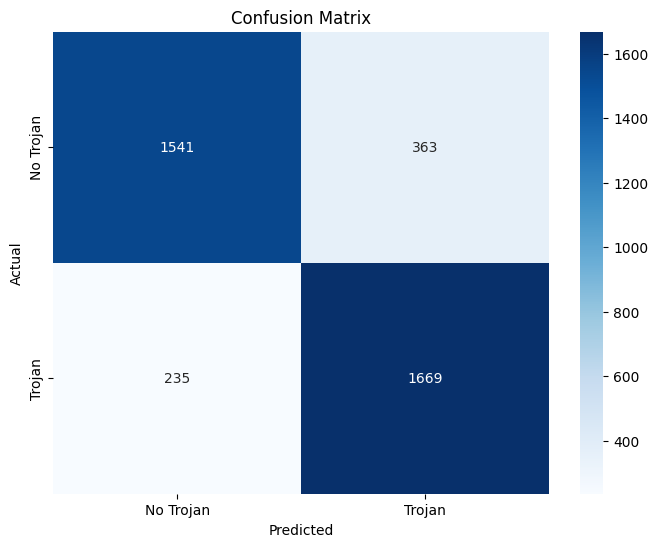

In [ ]:
from sklearn.metrics import accuracy_score, recall_score, f1_score, precision_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df1 is your DataFrame with 'tj' (ground truth) and 'tj-llama' (predictions)

y_true = df1['tj']
y_pred = df1['tj-llama3-3']

accuracy = accuracy_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)
f1 = f1_score(y_true, y_pred)
precision = precision_score(y_true, y_pred)

print(f"Accuracy: {accuracy}")
print(f"Recall: {recall}")
print(f"F1-Score: {f1}")
print(f"Precision: {precision}")

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['No Trojan', 'Trojan'],
            yticklabels=['No Trojan', 'Trojan'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

#### Checklist-based Review

In [ ]:
from huggingface_hub import InferenceClient

model_id="meta-llama/Llama-3.3-70B-Instruct"
client = InferenceClient(api_key="INSERT_API_KEY_HERE")

def query_LLM(verilog):

  # Truncate the Verilog code to a maximum number of tokens
  max_input_tokens = 3500  # Adjust this value as needed
  verilog = verilog[:max_input_tokens]

  messages = [
      { "role": "system", "content": """You are a expert in hardware security and has extensive knowledge regarding hardware trojans in Verilog designs. When analyzing a Verilog description of a circuit to detect hardware Trojans, it is important to consider that hardware Trojans are designed to evade detection and can have a variety of trigger mechanisms and payloads
. Therefore, the analysis should focus on identifying any suspicious logic or behavior that deviates from the expected functionality. Here are key aspects to focus on:
●
Rarely Triggered Logic: Hardware Trojans are often designed to activate only under specific, rare conditions to avoid detection during testing
. This means it's critical to identify any logic in the Verilog description that is only activated by unusual input combinations or sequences. These could be potential Trojan triggers. Analyzing the circuit's state space and controllability can help pinpoint these rare activation conditions
.
●
Unexecuted Code: Some hardware Trojans might reside in sections of the code that are never executed during normal operation
. Analyzing code coverage can help uncover these hidden portions of the code, which could potentially harbor malicious logic. Using line, toggle, statement, and Finite State Machine coverage algorithms can help identify these unexecuted code sections
.
●
Redundant or Unexpected Logic: Hardware Trojans often involve adding extra circuitry or modifying existing circuitry to implement their malicious functionality
. Thoroughly reviewing the Verilog description for any logic that appears redundant, unnecessary, or inconsistent with the circuit's intended functionality is crucial. Such anomalies could be signs of Trojan payloads. Comparing the circuit's structure with a known-good reference, if available, can help identify structural modifications
.
●
Deviations from Specifications: Hardware Trojans can cause the circuit to deviate from its intended behavior, especially under specific conditions or corner cases
. Comparing the circuit's behavior as described in the Verilog code with its formal specifications is essential. Any discrepancies, especially under rare or boundary conditions, could point towards the presence of a Trojan. Formal verification techniques can help prove or disprove that the circuit adheres to its security properties
.
●
Untestable Stuck-at Faults: While not directly related to hardware Trojans, untestable stuck-at faults can complicate Trojan detection
. ATPG techniques can help identify these faults, and removing the corresponding gates from the circuit can simplify the analysis and potentially make Trojan detection easier
.
●
Timing Anomalies: Hardware Trojans might introduce unexpected delays or timing variations in the circuit
. Analyzing the timing characteristics of the circuit as described in the Verilog code, especially under different operating conditions, is crucial. Any significant deviations from the expected timing behavior could indicate the presence of a Trojan. Techniques like path delay fingerprinting can be used to compare timing characteristics with a golden reference
.
●
Suspicious Signals: Certain signals within the circuit might exhibit unusual behavior or patterns that could indicate malicious activity
. These could include signals with unusually low or high switching probabilities, signals that are highly correlated with specific inputs, or signals that appear to be used for unintended purposes. Techniques like signal correlation analysis and clustering can help identify suspicious signals. Equivalence checking can be used to compare these signals against the specifications from the IP provider.""" },
      { "role": "user", "content": "Given a Verilog design, evaluate if it has a trojan or not: " + verilog + """.
    Don't explain anything just answer with 1 if it probably has trojan or 0 otherwise.
    Do not deviate from the 0 or 1 answer pattern."""}
      ]

  output = client.chat.completions.create(
    model="meta-llama/Llama-3.3-70B-Instruct",
    messages=messages,
    temperature=0.5,
    max_tokens=10,
    top_p=0.5
  )

  # Extract the content of the model's response
  response_content = output.choices[0].message['content']
  print(response_content)

  # Remove any non-digit characters from the response content
  response_content = ''.join(filter(str.isdigit, response_content))
  #print(response_content)

  # Return the integer value or 0 if response is empty
  return int(response_content[0]) if response_content else 0

In [ ]:
query_LLM(df1['text'][0])

1


1

In [ ]:
df1['tj-llama3-3-simple'] = df1['text'].apply(query_LLM)

df1

1
1
1
1
1
1
1
0
1
1
1
1
1
1
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
1
0
0
0
0
0
1
0
0
0
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
1
0
1
1
1
1
0
1
0
1
0
1
1
1
0
0
0
1
1
0
1
0
1
1
1
1
0
1
1
0
1
1
1
1
0
1
1
0
0
1
0
0
0
1
0
0
1
0
0
1
0
0
1
0
0
0
1
0
0
0
1
0
0
0
0
0
0
0
0
1
0
0
0
1
0
0
0
1
1
1
0
0
0
1
1
0
1
0
1
1
1
1
0
0
0
0
1
0
0
1
0
1
1
1
0
1
0
1
0
1
1
1
0
0
0
1
1
0
1
0
1
1
1
1
0
1
1
0
1
1
1
1
0
1
1
0
0
1
1
1
0
1
1
1
1
0
0
1
1
1
1
0
0
0
1
0
0
1
1
1
1
0
0
1
1
1
0
1
1
0
0
1
1
0
1
1
1
1
1
0
0
1
1
0
1
0
1
1
1
1
0
0
0
0
1
0
1
1
1
1
1
1
1
1
1
1
1
0
1
1
1
1
1
1
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
1
0
0
0
0
0
1
0
0
0
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
1
0
1
1
1
1
0
1
0
1
0
1
1
1
0
0
0
1
1
0
1
0
1
1
1
1
0
1
1
0
1
1
1
1
0
1
1
0
0
1
0
0
0
1
0
0
1
0
0
1
0
0
1
0
0
0
1
0
0
0
1
0
0
0
0
0
0
0
0
1
0
0
0
1
0
0
0
1
1
1
0
0
0
1
1
0
1
0
1
1
1
1
0
0
0
0
1
0
0
1
0
1
1
1
0
1
0
1
0
1
1
1
0
0
0
1
1
0
1
0
1
1
1
1
0
1
1
0
1
1
1
1
0
1
1
0
0
1
1
1
0
1
1
1
1
0
0
1
1
1


,text,tj,tj-llama-simple,tj-llama3-3-simple
0,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0,1,1
1,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0,1,1
2,"\nmodule s1423 ( CK, G0, G1, G10, G11, G12, G1...",0,1,1
3,"\nmodule s13207 ( CK, g1, g10, g1000, g1006, g...",0,1,1
4,"\nmodule s15850 ( CK, g100, g101, g102, g103, ...",0,1,1
...,...,...,...,...
3803,"module FA(input a,b,cin,\n output c,s...",1,1,1
3804,module addressgenerator (input clk...,1,1,1
3805,"module div2(input [11:0] x,\n outpu...",1,1,1
3806,"module KyberHPM16PE #(parameter PE_NUMBER=16,\...",1,1,1


Accuracy: 0.7014180672268907
Recall: 0.9957983193277311
F1-Score: 0.7693244065733414
Precision: 0.6267768595041322


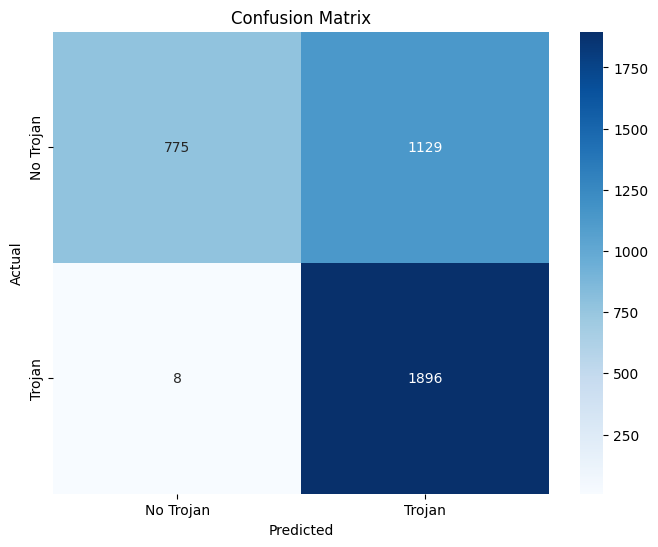

In [ ]:
from sklearn.metrics import accuracy_score, recall_score, f1_score, precision_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df1 is your DataFrame with 'tj' (ground truth) and 'tj-llama' (predictions)

y_true = df1['tj']
y_pred = df1['tj-llama3-3-simple']

accuracy = accuracy_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)
f1 = f1_score(y_true, y_pred)
precision = precision_score(y_true, y_pred)

print(f"Accuracy: {accuracy}")
print(f"Recall: {recall}")
print(f"F1-Score: {f1}")
print(f"Precision: {precision}")

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['No Trojan', 'Trojan'],
            yticklabels=['No Trojan', 'Trojan'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

#### Perspective-based Analysis

##### Verification Engineer

In [ ]:
from huggingface_hub import InferenceClient

model_id="meta-llama/Llama-3.3-70B-Instruct"
client = InferenceClient(api_key="INSERT_API_KEY_HERE")

def query_LLM(verilog):

  # Truncate the Verilog code to a maximum number of tokens
  max_input_tokens = 3500  # Adjust this value as needed
  verilog = verilog[:max_input_tokens]

  messages = [
    { "role": "system", "content": """You are a Verification Engineer. Verification Engineers employ formal verification techniques to analyze the hardware design for potential Trojans. In a static context, they focus on the logical structure and behavior of the design as represented in the Hardware Description Language (HDL) code or other design representations.
Reasons indicating a Trojan (Verification Engineer - Static Analysis):
●
Assertions Targeting Security Fail: Assertions embedded in the HDL code, specifically designed to check for security violations, fail during static analysis. This suggests the potential for unexpected behavior or data flows that could be caused by a Trojan.
●
Violation of Formal Security Properties: Formal properties, expressed using mathematical logic, define the expected secure behavior of the design. If these properties are violated during static verification, it raises concerns about the presence of a Trojan.
●
Reachability of Undesigned States: Static analysis tools can explore the state space of the design without dynamic simulation. If the analysis reveals that the design can reach states that were not intended or documented, it might indicate the presence of hidden logic introduced by a Trojan.
●
Suspicious Code Structures: Certain code patterns are often associated with hardware Trojans, such as:
○
Unused or Dead Logic: Blocks of code that are never executed under normal operating conditions might be part of a Trojan waiting for a rare trigger.
○
Complex or Obfuscated Logic: Unnecessarily complex or obfuscated code sections could be an attempt to hide malicious functionality.
●
Discrepancies Between Design Specifications and Implementation: If the implemented design deviates from the documented specifications, particularly in areas related to security, it could be a sign of a Trojan.
Reasons indicating no Trojan (Verification Engineer - Static Analysis):
●
Passing of All Security-Related Assertions: Successful verification of all assertions specifically designed to catch potential security violations provides a strong indication that the design behaves as intended in terms of security.
●
Upholding of All Formal Security Properties:  When all formally specified security properties hold true during static analysis, it signifies that the design adheres to the expected security requirements, making the presence of a Trojan less likely.
●
Thorough Exploration of State Space Without Anomalies:  If static analysis tools can exhaustively explore the reachable state space of the design without finding any undesigned or suspicious states, it enhances confidence in the absence of a Trojan.
●
Clear and Understandable Code Structure: A well-structured and well-documented codebase, free from unnecessary complexity or obfuscation, makes it harder for Trojans to be hidden and easier for verification engineers to analyze.
●
Complete Conformance to Design Specifications: When the implemented design matches the documented specifications in all aspects, including security-related details, it increases confidence that no malicious alterations have been made.""" },
    { "role": "user", "content": "Given a Verilog design, evaluate if it has a trojan or not: " + verilog + """.
    Don't explain anything just answer with 1 if it probably has trojan or 0 otherwise.
    Do not deviate from the 0 or 1 answer pattern."""}
  ]

  output = client.chat.completions.create(
    model="meta-llama/Llama-3.3-70B-Instruct",
    messages=messages,
    temperature=0.5,
    max_tokens=10,
    top_p=0.5
  )

  # Extract the content of the model's response
  response_content = output.choices[0].message['content']
  print(response_content)

  # Remove any non-digit characters from the response content
  response_content = ''.join(filter(str.isdigit, response_content))
  #print(response_content)

  # Return the integer value or 0 if response is empty
  return int(response_content[0]) if response_content else 0

In [ ]:
query_LLM(df1['text'][0])

1


1

In [ ]:
df1['tj-verification-engineer'] = df1['text'].apply(query_LLM)

df1

1
1
1
1
1
1
1
0
1
1
1
1
1
1
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
1
0
0
0
1
1
1
1
1
1
0
1
1
1
0
0
1
0
0
0
0
0
1
0
1
1
0
1
0
0
0
1
0
0
0
0
0
1
1
0
0
0
0
1
1
0
0
0
0
0
1
0
0
1
0
1
1
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
1
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
1
0
0
0
0
1
1
0
1
0
1
1
1
1
0
0
0
0
1
0
0
1
0
1
1
1
0
1
0
0
0
1
0
0
0
0
0
1
1
0
1
0
0
1
1
0
0
1
0
0
1
0
0
1
0
1
1
0
0
0
1
0
0
1
0
0
0
0
0
1
0
1
1
0
0
0
1
0
0
1
0
1
1
0
0
1
0
0
0
1
1
0
0
1
0
0
0
1
1
1
1
0
0
1
1
0
1
0
1
1
1
1
0
0
0
0
1
0
0
1
0
0
1
1
1
1
1
1
1
0
1
1
1
1
1
1
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
1
0
0
0
1
1
1
1
1
1
0
1
1
1
0
0
1
0
0
0
0
0
1
0
1
1
0
1
0
0
0
1
0
0
0
0
0
1
1
0
0
0
0
1
1
0
0
0
0
0
1
0
0
1
0
1
1
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
1
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
1
0
0
0
0
1
1
0
1
0
1
1
1
1
0
0
0
0
1
0
0
1
0
1
1
1
0
1
0
0
0
1
0
0
0
0
0
1
1
0
1
0
0
1
1
0
0
1
0
0
1
0
0
1
0
1
1
0
0
0
1
0
0
1
0
0
0
0
0
1
0
1


,text,tj,tj-llama,tj-llama3-3,tj-verification-engineer
0,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0,0,0,1
1,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0,0,0,1
2,"\nmodule s1423 ( CK, G0, G1, G10, G11, G12, G1...",0,0,1,1
3,"\nmodule s13207 ( CK, g1, g10, g1000, g1006, g...",0,0,1,1
4,"\nmodule s15850 ( CK, g100, g101, g102, g103, ...",0,1,1,1
...,...,...,...,...,...
3803,"module FA(input a,b,cin,\n output c,s...",1,1,1,1
3804,module addressgenerator (input clk...,1,1,1,1
3805,"module div2(input [11:0] x,\n outpu...",1,1,1,1
3806,"module KyberHPM16PE #(parameter PE_NUMBER=16,\...",1,1,1,1


Accuracy: 0.7762605042016807
Recall: 0.9889705882352942
F1-Score: 0.815504547423127
Precision: 0.6938098747236551


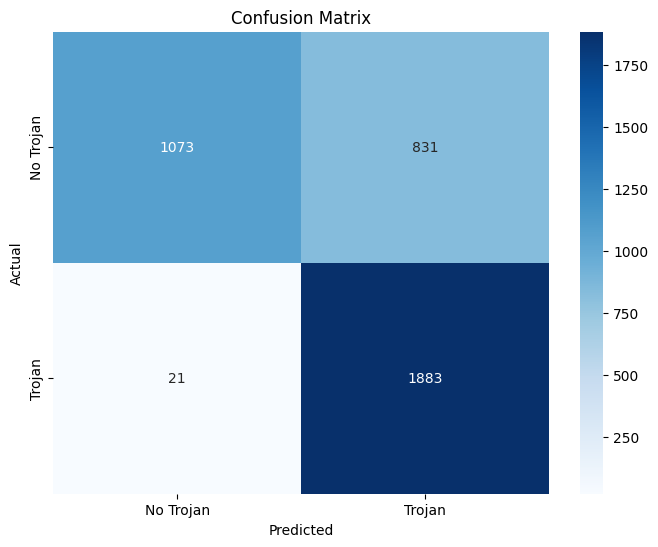

In [ ]:
from sklearn.metrics import accuracy_score, recall_score, f1_score, precision_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df1 is your DataFrame with 'tj' (ground truth) and 'tj-llama' (predictions)

y_true = df1['tj']
y_pred = df1['tj-verification-engineer']

accuracy = accuracy_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)
f1 = f1_score(y_true, y_pred)
precision = precision_score(y_true, y_pred)

print(f"Accuracy: {accuracy}")
print(f"Recall: {recall}")
print(f"F1-Score: {f1}")
print(f"Precision: {precision}")

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['No Trojan', 'Trojan'],
            yticklabels=['No Trojan', 'Trojan'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

##### Security Analyst

In [ ]:
from huggingface_hub import InferenceClient

model_id="meta-llama/Llama-3.3-70B-Instruct"
client = InferenceClient(api_key="INSERT_API_KEY_HERE")

def query_LLM(verilog):

  # Truncate the Verilog code to a maximum number of tokens
  max_input_tokens = 3500  # Adjust this value as needed
  verilog = verilog[:max_input_tokens]

  messages = [
    { "role": "system", "content": """You are a Security Analyst. Security Analysts leverage their knowledge of attack strategies, threat models, and hardware vulnerabilities to scrutinize the design for potential Trojan insertion points and malicious modifications.
Reasons indicating a Trojan (Security Analyst - Static Analysis):
●
Identification of Potential Trigger Mechanisms: Analyzing the design for conditions or signals that could activate a Trojan. This might involve looking for:
○
Rare Event Detectors: Logic that responds to infrequently occurring events might be used to trigger a Trojan's malicious behavior.
○
External Interfaces: Analyzing external interfaces for potential misuse or vulnerabilities that could be exploited to activate a Trojan.
○
Unusual Timing or Clocking Logic:  Trojans might rely on specific timing relationships or clock signals to activate their payload.
●
Detection of Suspicious Data Flows: Tracing data paths within the design to identify:
○
Unauthorized Access to Secure Data:  Trojans may attempt to access or leak confidential information by creating hidden data paths.
○
Bypassing of Security Mechanisms:  Looking for ways a Trojan could circumvent security protocols or access control measures.
●
Analysis of Unused Resources and Functionality: Examining:
○
Unused Memory or Registers:  These could be used to store malicious code or data.
○
Disabled or Hidden Functionality: Analyzing whether these have been tampered with or could be activated maliciously.
●
Scrutiny of Third-Party IP Cores:  If the design incorporates IP cores from external sources, a security analyst would pay particular attention to these, as they represent potential points of Trojan insertion.
●
Review of Design for Trustworthiness (DfT) Measures:  Evaluating whether appropriate DfT techniques have been incorporated into the design to make it more resilient to Trojan attacks. If DfT measures are weak or absent, it increases the risk of Trojans.
Reasons indicating no Trojan (Security Analyst - Static Analysis):
●
Adherence to Secure Design Principles: A design that demonstrably follows established secure design principles, such as secure coding guidelines, least privilege access, and compartmentalization, is less likely to harbor Trojans.
●
Absence of Known Trojan Patterns:  Not finding any code structures or design elements commonly associated with hardware Trojans (e.g., unused logic, rare triggers, suspicious data flows) provides a positive indicator.
●
Strong Security Verification Results: If the design has undergone rigorous security verification, including formal methods and manual code review by security experts, and no vulnerabilities have been identified, it enhances confidence in the absence of Trojans.
●
Utilization of Trusted Design Sources: Employing only trusted third-party IP cores and design tools from reputable vendors significantly reduces the risk of Trojan insertion.
●
Incorporation of Robust Design for Trust (DfT) Features:  A design that incorporates strong DfT measures, like logic obfuscation, tamper detection mechanisms, or runtime monitoring, demonstrates a proactive approach to security and makes it much harder for Trojans to be successfully inserted or activated.
""" },
    { "role": "user", "content": "Given a Verilog design, evaluate if it has a trojan or not: " + verilog + """.
    Don't explain anything just answer with 1 if it probably has trojan or 0 otherwise.
    Do not deviate from the 0 or 1 answer pattern."""}
  ]

  output = client.chat.completions.create(
    model="meta-llama/Llama-3.3-70B-Instruct",
    messages=messages,
    temperature=0.5,
    max_tokens=10,
    top_p=0.5
  )

  # Extract the content of the model's response
  response_content = output.choices[0].message['content']
  print(response_content)

  # Remove any non-digit characters from the response content
  response_content = ''.join(filter(str.isdigit, response_content))
  #print(response_content)

  # Return the integer value or 0 if response is empty
  return int(response_content[0]) if response_content else 0

In [ ]:
query_LLM(df1['text'][0])

1


1

In [ ]:
df1['tj-security-analyst'] = df1['text'].apply(query_LLM)

df1

1
1
1
1
1
1
1
0
1
1
1
1
1
1
0
0
0
0
0
0
0
1
1
1
0
1
1
1
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
1
0
0
0
1
1
1
1
1
1
0
1
1
1
0
0
0
0
0
0
0
0
1
0
1
1
0
1
0
0
0
1
0
1
0
0
0
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
1
1
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
1
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
0
1
0
1
1
1
0
0
0
0
0
0
0
0
1
0
1
1
1
0
1
0
0
0
1
0
1
0
0
0
1
1
0
1
0
0
0
0
0
0
1
0
0
0
0
0
1
0
1
1
0
0
0
1
0
0
1
0
0
0
0
0
1
0
1
1
0
0
0
1
0
0
0
0
1
1
0
0
1
0
0
0
1
1
0
0
1
0
0
0
1
1
1
1
0
0
0
1
0
1
0
1
1
1
1
0
0
0
0
0
0
0
1
0
0
1
1
1
1
1
1
1
0
1
1
1
1
1
1
0
0
0
0
0
0
0
1
1
1
0
1
1
1
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
1
0
0
0
1
1
1
1
1
1
0
1
1
1
0
0
0
0
0
0
0
0
1
0
1
1
0
1
0
0
0
1
0
1
0
0
0
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
1
1
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
1
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
0
1
0
1
1
1
0
0
0
0
0
0
0
0
1
0
1
1
1
0
1
0
0
0
1
0
1
0
0
0
1
1
0
1
0
0
0
0
0
0
1
0
0
0
0
0
1
0
1
1
0
0
0
1
0
0
1
0
0
0
0
0
1
0
1


,text,tj,tj-llama,tj-llama3-3,tj-verification-engineer,tj-security-analyst
0,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0,0,0,1,1
1,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0,0,0,1,1
2,"\nmodule s1423 ( CK, G0, G1, G10, G11, G12, G1...",0,0,1,1,1
3,"\nmodule s13207 ( CK, g1, g10, g1000, g1006, g...",0,0,1,1,1
4,"\nmodule s15850 ( CK, g100, g101, g102, g103, ...",0,1,1,1,1
...,...,...,...,...,...,...
3803,"module FA(input a,b,cin,\n output c,s...",1,1,1,1,1
3804,module addressgenerator (input clk...,1,1,1,1,1
3805,"module div2(input [11:0] x,\n outpu...",1,1,1,1,1
3806,"module KyberHPM16PE #(parameter PE_NUMBER=16,\...",1,1,1,1,1


Accuracy: 0.8067226890756303
Recall: 0.9884453781512605
F1-Score: 0.8364444444444444
Precision: 0.7249614791987673


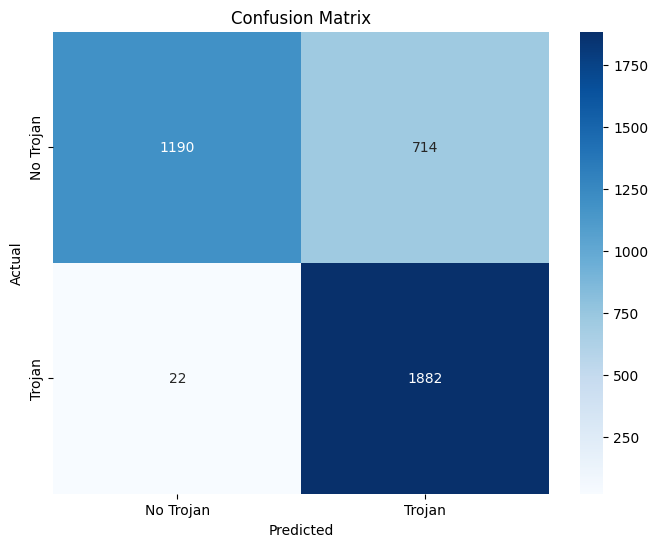

In [ ]:
from sklearn.metrics import accuracy_score, recall_score, f1_score, precision_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df1 is your DataFrame with 'tj' (ground truth) and 'tj-llama' (predictions)

y_true = df1['tj']
y_pred = df1['tj-security-analyst']

accuracy = accuracy_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)
f1 = f1_score(y_true, y_pred)
precision = precision_score(y_true, y_pred)

print(f"Accuracy: {accuracy}")
print(f"Recall: {recall}")
print(f"F1-Score: {f1}")
print(f"Precision: {precision}")

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['No Trojan', 'Trojan'],
            yticklabels=['No Trojan', 'Trojan'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

##### Test Engineer

In [ ]:
from huggingface_hub import InferenceClient

model_id="meta-llama/Llama-3.3-70B-Instruct"
client = InferenceClient(api_key="INSERT_API_KEY_HERE")

def query_LLM(verilog):

  # Truncate the Verilog code to a maximum number of tokens
  max_input_tokens = 3500  # Adjust this value as needed
  verilog = verilog[:max_input_tokens]

  messages = [
    { "role": "system", "content": """You are a Test Engineer. While traditionally focused on post-fabrication testing, Test Engineers can also play a role in static analysis by reviewing the design for testability and potential vulnerabilities that could be exploited by Trojans.
Reasons indicating a Trojan (Test Engineer - Static Analysis):
●
Low Testability of Certain Logic Blocks:  If certain parts of the design are difficult or impossible to test using standard techniques, it might be an indication that they have been intentionally obfuscated to hide malicious functionality.
●
Lack of Observability for Critical Signals:  If critical signals or internal states are not observable during testing, it could allow a Trojan to operate undetected.
●
Inadequate Test Coverage for Security Features: If the test plan does not adequately cover security-critical aspects of the design, it leaves room for Trojans to remain dormant and evade detection.
●
Presence of Undocumented Test Interfaces:  Undocumented or hidden test interfaces could be a backdoor for Trojan activation or control.
●
Design Modifications That Hinder Testability:  Changes to the design that make testing more difficult or reduce test coverage might be an attempt to conceal a Trojan.
Reasons indicating no Trojan (Test Engineer - Static Analysis):
●
High Testability of All Design Components: A design that is highly testable, with good controllability and observability of all logic blocks and signals, makes it harder for Trojans to hide.
●
Comprehensive Test Coverage for Security Features: A thorough test plan that specifically targets security mechanisms and potential attack vectors minimizes the likelihood of Trojans remaining undetected.
●
Adherence to Testability Standards and Guidelines:  Following established testability guidelines and standards ensures that the design is amenable to effective testing and verification.
●
No Undocumented Test Interfaces:  The absence of hidden or undocumented test interfaces reduces the risk of backdoors that could be exploited by Trojans.
●
Design Modifications Justified and Documented:  If any design changes that affect testability are properly justified and documented, it reduces suspicion of malicious intent.""" },
    { "role": "user", "content": "Given a Verilog design, evaluate if it has a trojan or not: " + verilog + """.
    Don't explain anything just answer with 1 if it probably has trojan or 0 otherwise.
    Do not deviate from the 0 or 1 answer pattern."""}
  ]

  output = client.chat.completions.create(
    model="meta-llama/Llama-3.3-70B-Instruct",
    messages=messages,
    temperature=0.5,
    max_tokens=10,
    top_p=0.5
  )

  # Extract the content of the model's response
  response_content = output.choices[0].message['content']
  print(response_content)

  # Remove any non-digit characters from the response content
  response_content = ''.join(filter(str.isdigit, response_content))
  #print(response_content)

  # Return the integer value or 0 if response is empty
  return int(response_content[0]) if response_content else 0

In [ ]:
query_LLM(df1['text'][0])

1


1

In [ ]:
df1['tj-test-engineer'] = df1['text'].apply(query_LLM)

df1

1
1
1
1
1
1
1
0
1
1
1
1
1
1
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
1
0
0
0
0
0
1
0
0
0
1
1
1
1
1
1
1
1
1
1
1
0
1
0
0
0
1
0
1
1
1
1
0
1
0
1
0
1
0
1
0
0
0
1
1
0
1
0
1
1
1
1
0
1
1
0
1
0
1
1
0
1
1
0
0
1
0
0
0
1
0
0
0
0
0
0
0
0
1
0
0
0
1
0
0
0
1
0
0
0
0
0
0
0
1
1
0
0
0
1
0
0
0
0
1
0
0
0
0
1
1
0
1
0
1
1
1
1
0
0
0
0
1
0
0
1
0
1
1
1
0
1
0
0
0
1
0
1
0
0
0
1
1
0
1
0
1
1
1
1
0
1
1
0
1
0
0
1
0
1
1
0
0
1
1
1
0
1
1
0
1
0
0
1
1
1
1
0
0
0
1
0
0
1
1
1
1
0
0
1
0
1
0
1
1
0
0
1
0
1
0
1
1
1
1
1
0
1
1
0
1
0
1
1
1
1
0
0
0
0
1
0
1
1
1
1
1
1
1
1
1
1
1
0
1
1
1
1
1
1
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
1
0
0
0
0
0
1
0
0
0
1
1
1
1
1
1
1
1
1
1
1
0
1
0
0
0
1
0
1
1
1
1
0
1
0
1
0
1
0
1
0
0
0
1
1
0
1
0
1
1
1
1
0
1
1
0
1
0
1
1
0
1
1
0
0
1
0
0
0
1
0
0
0
0
0
0
0
0
1
0
0
0
1
0
0
0
1
0
0
0
0
0
0
0
1
1
0
0
0
1
0
0
0
0
1
0
0
0
0
1
1
0
1
0
1
1
1
1
0
0
0
0
1
0
0
1
0
1
1
1
0
1
0
0
0
1
0
1
0
0
0
1
1
0
1
0
1
1
1
1
0
1
1
0
1
0
0
1
0
1
1
0
0
1
1
1
0
1
1
0
1
0
0
1
1
1


,text,tj,tj-llama,tj-llama3-3,tj-verification-engineer,tj-security-analyst,tj-test-engineer
0,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0,0,0,1,1,1
1,"\nmodule vga_enh_top_DW01_dec_1 ( A, SUM );\n ...",0,0,0,1,1,1
2,"\nmodule s1423 ( CK, G0, G1, G10, G11, G12, G1...",0,0,1,1,1,1
3,"\nmodule s13207 ( CK, g1, g10, g1000, g1006, g...",0,0,1,1,1,1
4,"\nmodule s15850 ( CK, g100, g101, g102, g103, ...",0,1,1,1,1,1
...,...,...,...,...,...,...,...
3803,"module FA(input a,b,cin,\n output c,s...",1,1,1,1,1,1
3804,module addressgenerator (input clk...,1,1,1,1,1,1
3805,"module div2(input [11:0] x,\n outpu...",1,1,1,1,1,1
3806,"module KyberHPM16PE #(parameter PE_NUMBER=16,\...",1,1,1,1,1,1


Accuracy: 0.720063025210084
Recall: 0.9957983193277311
F1-Score: 0.7805681350349938
Precision: 0.6418415707515234


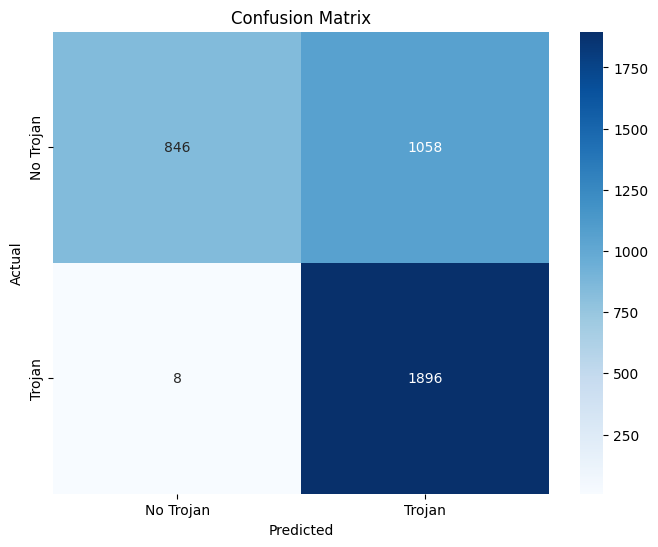

In [ ]:
from sklearn.metrics import accuracy_score, recall_score, f1_score, precision_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df1 is your DataFrame with 'tj' (ground truth) and 'tj-llama' (predictions)

y_true = df1['tj']
y_pred = df1['tj-test-engineer']

accuracy = accuracy_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)
f1 = f1_score(y_true, y_pred)
precision = precision_score(y_true, y_pred)

print(f"Accuracy: {accuracy}")
print(f"Recall: {recall}")
print(f"F1-Score: {f1}")
print(f"Precision: {precision}")

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['No Trojan', 'Trojan'],
            yticklabels=['No Trojan', 'Trojan'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()